# Installing Libraries

In [ ]:
!pip install google-colab-selenium
!pip install selenium
!pip install undetected_chromedriver
!pip install google-colab-selenium[undetected]
!pip install langdetect

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.5/9.5 MB 17.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 486.3/486.3 kB 13.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.4/65.4 kB 5.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for undetected_chromedriver: filename=undetected_chromedriver-3.5.5-py3-none-any.whl size=47048 sha256=6978bc6bc3c4a2d402ea620e502bbb9a14a8651ac71debdcdc38e90eed49bb91
  Stored in directory: /root/.cache/pip/wheels/5c/b9/03/4b6e38f019d6170e8c25df2e1e362d7bdf9ff4012df2dc85c0
Successfully built undetected_chromedriver
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 981.5/981.5 kB 15.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for langdetect: filename=langdetect-1.0.9-py3-none-any.whl size=993222 sha256=96f3f097b69f10244ff21b4b749a41942a0fd737b55a60c3a11310143f201535
  Stored in directory: /root/.cache/pip/wheels/0a/f2/b2/e5ca405801e05eb7c8ed5b3b4bcf1fcabcd6272c16764007

In [ ]:
import time
import csv
import re
import undetected_chromedriver as uc
import google_colab_selenium as gs
from selenium import webdriver
from selenium.webdriver.chrome.options import Options
from selenium.webdriver.support.ui import WebDriverWait
from bs4 import BeautifulSoup
from urllib.parse import quote
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from collections import Counter
from urllib.parse import urlparse
import pandas as pd
import seaborn as sns
from textblob import TextBlob

# Parsing search engines to get search results

In [ ]:
def get_search_results(search_engine_name, search_engine_url, search_phrase, location = None):

    if location:
        if search_engine_name == "Google":
            search_url = f"{search_engine_url}{quote(search_phrase)}&gl={location}"
        elif search_engine_name == "Bing":
            search_url = f"{search_engine_url}{quote(search_phrase)}&cc={location}"
        # Add more search engines and their location parameters as needed
    else:
        search_url = search_engine_url + quote(search_phrase)

    # Set up headless browser options
    chrome_options = Options()
    chrome_options.add_argument("--headless")  # Optional: run headless
    chrome_options.add_argument("--no-sandbox")
    chrome_options.add_argument("--disable-dev-shm-usage")
    chrome_options.add_argument("user-agent=Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/115.0.0.0 Safari/537.36")
    chrome_options.add_argument("--disable-blink-features=AutomationControlled")

    # chromedriver_autoinstaller.install()
    driver = webdriver.Chrome(options=chrome_options)

    # Navigate to the search URL
    driver.get(search_url)
    wait = WebDriverWait(driver, 20)  # Allow time for the page to load

    # Get the updated URL and page source
    updated_url = driver.current_url
    html = driver.page_source
    driver.quit()

    # Parse the HTML with BeautifulSoup
    soup = BeautifulSoup(html, 'html.parser')
    results = []

    # Extract search results based on the search engine
    if search_engine_name == "Google":
        results = soup.find_all('div', class_='g')
    elif search_engine_name == "Bing":
        results = soup.find_all('li', class_='b_algo')
    elif search_engine_name == "Brave":
        results = soup.find_all('div', class_='snippet svelte-n9nog2')  # Example class (check Brave's source code)
    elif search_engine_name == "DuckDuckGo":
        results = soup.find_all('article')

    results_info = []

    for result in results:
        title = ""
        link = ""
        date = ""
        try:
            if search_engine_name == "Google":
              title_container = result.select_one('.tF2Cxc h3')  # Use .tF2Cxc to locate titles
              link_container = result.select_one('.tF2Cxc a')  # Use .tF2Cxc to locate links

              if title_container:
                  title = title_container.text
              if link_container:
                  link = link_container['href']

            elif search_engine_name == "Bing":
                title_container = result.find('h2').find('a')
                if title_container:
                    title = ''.join(title_container.find_all(string=True, recursive=True))
                    link = title_container['href']

            elif search_engine_name == "Brave":
              # Find the link container <a> element
              title_container = result.find('div', class_='title svelte-yo6adg')

              # Extract and print the text content
              if title_container:
                  title = title_container.get_text(strip=True)
                  title_container = result.find('a')
                  # Extract the link from the href attribute
                  link = title_container['href']

              title_container = result.find('div', class_='title mt-s svelte-yo6adg')
              if title_container:
                  title = title_container.get_text(strip=True)
                  title_container = result.find('a')
                  # Extract the link from the href attribute
                  link = title_container['href']

            elif search_engine_name == "DuckDuckGo":
                title_container = result.find('h2').find('a').find('span')
                link_container = result.find('a', class_="Rn_JXVtoPVAFyGkcaXyK")
                if title_container:
                    title = ''.join(title_container.find_all(string=True, recursive=True))
                if link_container:
                    link = link_container['href']

        except Exception as e:
            print(f"Error parsing result: {e}")

        results_info.append({"title": title, "link": link})

    # Extract all visible text from the page
    visible_eng_text = soup.get_text(separator=' ')
    visible_eng_text = re.sub(r'[^\x00-\x7F]+', ' ', visible_eng_text)
    visible_eng_text = re.sub(r'\n', ' ', visible_eng_text)
    visible_eng_text = re.sub(r'\s+', ' ', visible_eng_text)

    # Extract all hyperlinks from the page
    all_links = []
    for link in soup.find_all('a'):
        href = link.get('href')
        if href:
            all_links.append(href)

    # Prepare search information to return
    search_info = {
        "search_engine": search_engine_name,
        "search_phrase": search_phrase,
        "search_url": updated_url,
        "results": results_info,
        "visible_text": visible_eng_text,
        "all_links": all_links
    }

    return search_info

# Storing in CSV

In [ ]:
import csv

def save_to_csv(search_phrases, search_engine_urls, csv_filename, location=None):
    # Prepare CSV file and write header
    if location:
        header = ['location', 'title(Google)', 'link(Google)', 'title(Bing)', 'link(Bing)']
    else:
        header = ['title(Google)', 'link(Google)', 'title(Bing)', 'link(Bing)', 'title(Brave)', 'link(Brave)', 'title(DuckDuckGo)', 'link(DuckDuckGo)']

    with open(csv_filename, mode='w', newline='', encoding='utf-8') as file:
        writer = csv.writer(file)
        writer.writerow(header)

        # For each search phrase
        for search_phrase in search_phrases:
            # Prepare a list to store the results for each search engine
            google_titles = []
            google_links = []
            bing_titles = []
            bing_links = []
            brave_titles = []
            brave_links = []
            duckduckgo_titles = []
            duckduckgo_links = []

            # For each search engine, gather results
            for search_engine_name, search_engine_url in search_engine_urls.items():
                # Skip Brave and DuckDuckGo if location is specified
                if location and search_engine_name not in ["Google", "Bing"]:
                    continue

                search_info = get_search_results(search_engine_name, search_engine_url, search_phrase, location)
                print(f"{search_engine_name} search for '{search_phrase}' returned {len(search_info['results'])} results")

                # Collect titles and links for each search engine
                if search_engine_name == "Google":
                    for result in search_info['results']:
                        google_titles.append(result['title'])
                        google_links.append(result['link'])
                elif search_engine_name == "Bing":
                    for result in search_info['results']:
                        bing_titles.append(result['title'])
                        bing_links.append(result['link'])
                elif search_engine_name == "Brave":
                    for result in search_info['results']:
                        brave_titles.append(result['title'])
                        brave_links.append(result['link'])
                elif search_engine_name == "DuckDuckGo":
                    for result in search_info['results']:
                        duckduckgo_titles.append(result['title'])
                        duckduckgo_links.append(result['link'])

            # Determine the max number of results across all search engines
            if location:
                max_results = max(len(google_titles), len(bing_titles))
            else:
                max_results = max(len(google_titles), len(bing_titles), len(brave_titles), len(duckduckgo_titles))

            # Append rows for each result, ensuring alignment across search engines
            for i in range(max_results):
                row = []

                # Add location if specified
                if location:
                    row.append(location)

                # Google results
                row.append(google_titles[i] if i < len(google_titles) else '')
                row.append(google_links[i] if i < len(google_links) else '')

                # Bing results
                row.append(bing_titles[i] if i < len(bing_titles) else '')
                row.append(bing_links[i] if i < len(bing_links) else '')

                if not location:
                    # Brave results
                    row.append(brave_titles[i] if i < len(brave_titles) else '')
                    row.append(brave_links[i] if i < len(brave_links) else '')

                    # DuckDuckGo results
                    row.append(duckduckgo_titles[i] if i < len(duckduckgo_titles) else '')
                    row.append(duckduckgo_links[i] if i < len(duckduckgo_links) else '')

                # Write the row to the CSV file
                writer.writerow(row)

# Word Cloud for analysing frequency of words and domains

In [ ]:
def generate_word_cloud_from_titles(search_engine_name, titles, output_file):
    # Combine all titles into a single string

    # Clean and preprocess the text
    combined_titles = re.sub(r'[^\x00-\x7F]+', ' ', titles)  # Remove non-ASCII characters
    combined_titles = re.sub(r'\n', ' ', combined_titles)  # Remove newlines
    combined_titles = re.sub(r'\s+', ' ', combined_titles)  # Remove extra whitespace
    combined_titles = combined_titles.lower()  # Convert to lowercase

    # Tokenize words and remove common stop words
    stop_words = set([
        'the', 'and', 'of', 'in', 'to', 'a', 'is', 'for', 'on', 'with', 'at',
        'this', 'that', 'by', 'it', 'are', 'as', 'from', 'an', 'be', 'or', 'was', 'we',
        'can', 'not', 'you', 'have', 'will', 'has', 'if', 'all','why','about','do', 'does','us','what'
    ])
    words = [word for word in re.findall(r'\b\w+\b', combined_titles) if word not in stop_words]

    # Generate word frequency
    word_counts = Counter(words)

    # Generate and save the word cloud
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_counts)

    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f"Word Cloud for {search_engine_name}", fontsize=16)
    plt.show()

In [ ]:
def extract_domains(links):
    # Extract domains and TLDs from the links
    domains = []
    for link in links:
        try:
            domain = urlparse(link).netloc  # Extract domain
            tld = "." + domain.split(".")[-1]  # Extract top-level domain
            domains.append(tld)
        except Exception:
            continue
    return domains

def generate_word_cloud_from_domains(search_engine_name, domains, output_file):
    # Generate word frequency
    domain_counts = Counter(domains)

    # Generate and save the word cloud
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(domain_counts)

    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f"Word Cloud for {search_engine_name} (Domains)", fontsize=16)
    plt.show()

In [ ]:
def generate_word_clouds(csv_filename):
    """Read the CSV, extract titles and domains, and generate word clouds."""
    df = pd.read_csv(csv_filename)

    search_engine_titles = {}
    search_engine_domains = {}

    for column in df.columns:
        if "title" in column.lower():
            search_engine = column.split("(")[1].split(")")[0]  # Extract search engine name
            search_engine_titles[search_engine] = " ".join(df[column].dropna())

        if "link" in column.lower():
            search_engine = column.split("(")[1].split(")")[0]
            search_engine_domains[search_engine] = extract_domains(df[column].dropna())

    # Generate and save word clouds for titles
    for search_engine_name, titles in search_engine_titles.items():
        output_file = f"{search_engine_name}_word_cloud.png"
        generate_word_cloud_from_titles(search_engine_name, titles, output_file)

    # Generate and save word clouds for domains
    for search_engine_name, domains in search_engine_domains.items():
        output_file = f"{search_engine_name}_domain_word_cloud.png"
        generate_word_cloud_from_domains(search_engine_name, domains, output_file)

# Sentiment Analysis (Polarity and subjectivity)

In [ ]:
def analyze_sentiment(csv_filename):
    # Read the CSV file
    df = pd.read_csv(csv_filename)

    # Prepare a dictionary to store sentiment results
    sentiment_data = {
        "Search Engine": [],
        "Polarity": [],
        "Subjectivity": [],
        "Type": []  # Positive, Neutral, Negative
    }

    # Iterate through each column containing search results
    for column in df.columns:
        if "title" in column.lower() or "link" in column.lower():
            search_engine = column.split("(")[1].split(")")[0]  # Extracting search engine name

            for text in df[column].dropna():  # Ignore empty rows
                analysis = TextBlob(str(text))
                polarity = analysis.sentiment.polarity
                subjectivity = analysis.sentiment.subjectivity

                # Classify as Positive, Neutral, or Negative
                if polarity > 0:
                    sentiment_type = "Positive"
                elif polarity < 0:
                    sentiment_type = "Negative"
                else:
                    sentiment_type = "Neutral"

                # Store the results
                sentiment_data["Search Engine"].append(search_engine)
                sentiment_data["Polarity"].append(polarity)
                sentiment_data["Subjectivity"].append(subjectivity)
                sentiment_data["Type"].append(sentiment_type)

    # Convert results to a DataFrame
    sentiment_df = pd.DataFrame(sentiment_data)

    # Save analyzed data to CSV
    sentiment_df.to_csv("sentiment_analysis_results.csv", index=False)
    print("Sentiment analysis results saved to sentiment_analysis_results.csv")

    # Generate sentiment distribution plots for each search engine
    unique_engines = sentiment_df["Search Engine"].unique()
    plt.figure(figsize=(12, 8))

    for i, engine in enumerate(unique_engines):
      plt.subplot(2, 2, i + 1)
      engine_df = sentiment_df[sentiment_df["Search Engine"] == engine]

      # Normalize sentiment counts to percentage
      sentiment_counts = engine_df["Type"].value_counts(normalize=True) * 100  # Convert to percentage

      sns.barplot(x=sentiment_counts.index, y=sentiment_counts.values,
                  palette={"Negative": "red", "Neutral": "blue", "Positive": "green"})

      plt.title(f"Sentiment Distribution for {engine}")
      plt.xlabel("Sentiment Type")
      plt.ylabel("Percentage (%)")


    # --- Comparison Plot ---
    sentiment_counts = sentiment_df.groupby(["Search Engine", "Type"]).size().reset_index(name="Count")
    total_counts = sentiment_counts.groupby("Search Engine")["Count"].transform("sum")
    sentiment_counts["Percentage"] = (sentiment_counts["Count"] / total_counts) * 100  # Convert to percentage

    # Plot percentage countplot
    plt.figure(figsize=(10, 6))
    sns.barplot(x="Search Engine", y="Percentage", hue="Type", data=sentiment_counts,
                palette={"Negative": "red", "Neutral": "blue", "Positive": "green"})

    plt.title("Sentiment Comparison Across Search Engines (Percentage)")
    plt.xlabel("Search Engine")
    plt.ylabel("Percentage (%)")
    plt.legend(title="Sentiment Type")
    plt.show()

    plt.figure(figsize=(12, 8))
    for i, engine in enumerate(unique_engines):
        plt.subplot(2, 2, i + 1)
        engine_df = sentiment_df[sentiment_df["Search Engine"] == engine]

        sns.histplot(engine_df["Subjectivity"], bins=20, kde=True, color="purple")
        plt.title(f"Subjectivity Distribution for {engine}")
        plt.xlabel("Subjectivity Score")
        plt.ylabel("Frequency")

    plt.tight_layout()
    plt.show()

    # --- Boxplot for Subjectivity ---
    plt.figure(figsize=(10, 6))
    sns.boxplot(x="Search Engine", y="Subjectivity", data=sentiment_df, palette="coolwarm")

    plt.title("Subjectivity Comparison Across Search Engines")
    plt.xlabel("Search Engine")
    plt.ylabel("Subjectivity Score (0 = Objective, 1 = Subjective)")
    plt.show()


# Exploring Domain Diversity

In [ ]:
from collections import Counter
from urllib.parse import urlparse
from matplotlib_venn import venn3

def extract_domain(url):
    try:
        return urlparse(url).netloc
    except:
        return None

def analyze_domain_diversity(csv_filename):
    df = pd.read_csv(csv_filename)
    domain_data = {}

    # Extract domains per search engine
    for column in df.columns:
        if "link" in column.lower():
            search_engine = column.split("(")[1].split(")")[0]
            domains = df[column].dropna().apply(extract_domain)
            domain_data[search_engine] = domains.tolist()

    # --- 1. Bar Chart: Top 10 Most Frequent Domains Per Search Engine ---
    plt.figure(figsize=(12, 6))
    for engine, domains in domain_data.items():
        domain_counts = Counter(domains).most_common(10)
        domains, counts = zip(*domain_counts)
        plt.barh(domains, counts, label=engine)
    plt.xlabel("Frequency")
    plt.ylabel("Domain")
    plt.title("Top 10 Most Frequent Domains Per Search Engine")
    plt.legend()
    plt.gca().invert_yaxis()
    plt.show()

    # --- 2. Venn Diagram: Domain Overlap Between Search Engines ---
    if len(domain_data) == 3:
        engines = list(domain_data.keys())
        sets = {engine: set(domain_data[engine]) for engine in engines}
        venn3([sets[engines[0]], sets[engines[1]], sets[engines[2]]], set_labels=engines)
        plt.title("Domain Overlap Between Search Engines")
        plt.show()

    # --- 3. Heatmap: Frequency of Domains Across Search Engines ---
    all_domains = list(set([domain for domains in domain_data.values() for domain in domains]))
    domain_matrix = pd.DataFrame(index=all_domains, columns=domain_data.keys()).fillna(0)
    for engine, domains in domain_data.items():
        for domain in domains:
            domain_matrix.loc[domain, engine] += 1
    plt.figure(figsize=(12, 6))
    sns.heatmap(domain_matrix, cmap="coolwarm", annot=False, linewidths=0.5)
    plt.title("Heatmap of Domain Frequency Across Search Engines")
    plt.xlabel("Search Engine")
    plt.ylabel("Domain")
    plt.show()


# N-Gram Analysis

In [73]:
import pandas as pd
from collections import Counter
from urllib.parse import urlparse
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction import text
import re

# Define additional stop words
additional_stop_words = {'https', 'http', 'www', 'com', 'org', 'net', 'edu', 'gov', 'ncbi', 'nlm', 'ojp', 'nih', 'ncjrs', 'quora', 'virtual', 'library', 'pmc'
                        , 'articles', 'sciencedirect', 'jhu', 'science', 'abstract', 'wikipedia', 'research', 'wiki', 'pewresearch', 'text', 'e2', '20f', '2024'
                        , 'news', 'gallup', 'nhs', 'bbc', '20in', '20the', 'en', 'topics', 'hrc', 'uk', 'article', 'stonewall', '20equality', '20act', 'americanprogress',
                         'cgi', 'viewcontent', 'duckduckgo js' 'js ad_domain', 'js', 'ad_provider', 'bingv7aa', 'bingv7aa', 'ad_type', 'duckduckgo', 'ad_domain',
                         'txad', 'click_metadata', '3d', 'rut', 'u3', 'За', '2f', '2fwww', '2fwww', 'bing', 'За', '2faclick', '2faclick', '3fld', 'iurl', '7b1',
                         '7b1' ,'7dig', '26id', '3ddevex', 'blogs', 'blog', 'sites', 'default', 'ldh', 'la', 'short', 'reads'}

# Combine default English stop words with additional ones
custom_stop_words = list(text.ENGLISH_STOP_WORDS.union(additional_stop_words))

# Helper function to clean text
def clean_text(text):
    # Remove URLs and domain-like patterns
    text = re.sub(r'http\S+|www\.\S+|\.com|\.org|\.net|\.edu|\.gov', '', text, flags=re.MULTILINE)
    return text

# Function to generate word clouds and n-gram analysis
def analyze_keywords(csv_filename):
    df = pd.read_csv(csv_filename)
    text_data = {}

    # Extract and clean titles and links text per search engine
    for column in df.columns:
        if "title" in column.lower() or "link" in column.lower():
            search_engine = column.split("(")[1].split(")")[0]
            texts = df[column].dropna().tolist()
            text_data[search_engine] = texts

    # --- N-gram Analysis (2-word & 3-word phrases) ---
    ngram_data = {}
    for engine, texts in text_data.items():
        combined_text = " ".join(texts)
        vectorizer = CountVectorizer(ngram_range=(2, 3), stop_words=custom_stop_words)
        ngram_counts = vectorizer.fit_transform([combined_text])
        ngram_sums = ngram_counts.sum(axis=0)
        ngram_freq = [(word, ngram_sums[0, idx]) for word, idx in vectorizer.vocabulary_.items()]
        ngram_freq = sorted(ngram_freq, key=lambda x: x[1], reverse=True)
        ngram_data[engine] = ngram_freq[:10]  # Top 10 n-grams

    # --- Bar Chart of Top N-grams ---
    plt.figure(figsize=(12, 6))
    for engine, ngrams in ngram_data.items():
        if ngrams:  # Check if there are n-grams to plot
            ngram_labels, ngram_values = zip(*ngrams)
            plt.barh(ngram_labels, ngram_values, label=engine)
    plt.xlabel("Frequency")
    plt.ylabel("N-gram")
    plt.title("Top N-grams Across Search Engines")
    plt.legend()
    plt.gca().invert_yaxis()
    plt.tight_layout()
    plt.show()

# Example usage
# analyze_keywords('search_results.csv')

# Geographical and Language Bias

In [69]:
import pandas as pd
from collections import Counter
from urllib.parse import urlparse
import matplotlib.pyplot as plt
import seaborn as sns
from langdetect import detect, DetectorFactory
import re

# Ensure consistent language detection results
DetectorFactory.seed = 0

# List of generic TLDs to exclude
generic_tlds = {'com', 'org', 'net', 'edu', 'gov', 'info', 'biz', 'int', 'mil'}

# Function to extract country code from domain
def extract_country_code(url):
    try:
        domain = urlparse(url).netloc
        match = re.search(r'\.(\w+)$', domain)
        if match:
            tld = match.group(1)
            if tld not in generic_tlds:
                return tld
    except:
        return None

# Function to detect language of a text
def detect_language(text):
    try:
        return detect(text)
    except:
        return 'unknown'

# Function to analyze geographical and language bias
def analyze_geographical_and_language_bias(csv_filename):
    df = pd.read_csv(csv_filename)
    search_engine_countries = {}
    search_engine_languages = {}

    # Extract country codes and detect languages
    for column in df.columns:
        if "link" in column.lower():
            search_engine = column.split("(")[1].split(")")[0]  # Extract search engine name
            country_codes = df[column].dropna().apply(extract_country_code).dropna().tolist()
            search_engine_countries[search_engine] = country_codes

        if "title" in column.lower():
            search_engine = column.split("(")[1].split(")")[0]
            languages = df[column].dropna().apply(detect_language).tolist()
            search_engine_languages[search_engine] = languages

    # --- Bar Chart: Country-wise Domain Distribution for each Search Engine ---
    plt.figure(figsize=(12, 8))
    for i, (engine, country_codes) in enumerate(search_engine_countries.items()):
        plt.subplot(2, 2, i + 1)
        country_counts = Counter(country_codes)
        sns.barplot(x=list(country_counts.keys()), y=list(country_counts.values()), palette='viridis')
        plt.xlabel("Country Code")
        plt.ylabel("Frequency")
        plt.title(f"Country-wise Domains for {engine}")
        plt.xticks(rotation=45)

    plt.tight_layout()
    plt.show()

    # --- Pie Chart: Language Distribution for each Search Engine ---
    plt.figure(figsize=(12, 8))
    for i, (engine, languages) in enumerate(search_engine_languages.items()):
        plt.subplot(2, 2, i + 1)
        language_counts = Counter(languages)
        plt.pie(language_counts.values(), labels=language_counts.keys(), autopct='%1.1f%%', startangle=140)
        plt.title(f"Language Distribution for {engine}")

    plt.tight_layout()
    plt.show()

# Analysing publication dates and recency

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime

# Function to parse and extract publication dates
def extract_publication_date(date_str):
    try:
        # Attempt to parse the date string
        return datetime.strptime(date_str, '%Y-%m-%d')
    except ValueError:
        # Handle different date formats or invalid dates
        return None

# Function to analyze freshness and recency of results
def analyze_freshness_and_recency(csv_filename):
    df = pd.read_csv(csv_filename)
    date_data = {}

    # Extract publication dates per search engine
    for column in df.columns:
        if "date" in column.lower():
            search_engine = column.split("(")[1].split(")")[0]
            dates = df[column].dropna().apply(extract_publication_date)
            date_data[search_engine] = dates.dropna()

    # --- Histogram of Publication Dates ---
    plt.figure(figsize=(12, 6))
    for engine, dates in date_data.items():
        sns.histplot(dates, bins=30, label=engine, kde=True)
    plt.xlabel("Publication Date")
    plt.ylabel("Frequency")
    plt.title("Distribution of Publication Dates")
    plt.legend()
    plt.tight_layout()
    plt.show()

    # --- Line Graph of Recency Trends ---
    plt.figure(figsize=(12, 6))
    for engine, dates in date_data.items():
        # Group by year-month and count occurrences
        date_counts = dates.dt.to_period('M').value_counts().sort_index()
        plt.plot(date_counts.index.to_timestamp(), date_counts.values, marker='o', label=engine)
    plt.xlabel("Date")
    plt.ylabel("Number of Articles")
    plt.title("Recency Trends Over Time")
    plt.legend()
    plt.tight_layout()
    plt.show()

# Example usage
# analyze_freshness_and_recency('search_results.csv')

In [ ]:
import csv

def save_search_results_to_csv(search_phrases, search_engine_urls, csv_filename, locations):
    # Prepare CSV header dynamically based on search engines and locations
    header = []
    for search_engine_name in search_engine_urls.keys():
        for location in locations:
            header.extend([f'title({search_engine_name}{location.upper()})', f'link({search_engine_name}{location.upper()})'])

    with open(csv_filename, mode='w', newline='', encoding='utf-8') as file:
        writer = csv.writer(file)
        writer.writerow(header)

        # For each search phrase
        for search_phrase in search_phrases:
            # Prepare a dictionary to store the results for each search engine and location
            results_dict = {f'{search_engine_name}{location.upper()}': {'titles': [], 'links': []}
                            for search_engine_name in search_engine_urls.keys() for location in locations}

            # For each search engine and location, gather results
            for search_engine_name, search_engine_url in search_engine_urls.items():
                for location in locations:
                    search_info = get_search_results(search_engine_name, search_engine_url, search_phrase, location)
                    print(f"{search_engine_name} search for '{search_phrase}' in {location} returned {len(search_info['results'])} results")

                    # Collect titles and links for each search engine and location
                    for result in search_info['results']:
                        results_dict[f'{search_engine_name}{location.upper()}']['titles'].append(result['title'])
                        results_dict[f'{search_engine_name}{location.upper()}']['links'].append(result['link'])

            # Determine the max number of results across all search engines and locations
            max_results = max(len(results['titles']) for results in results_dict.values())

            # Append rows for each result, ensuring alignment across search engines and locations
            for i in range(max_results):
                row = []
                for key in results_dict.keys():
                    titles = results_dict[key]['titles']
                    links = results_dict[key]['links']
                    row.append(titles[i] if i < len(titles) else '')
                    row.append(links[i] if i < len(links) else '')

                # Write the row to the CSV file
                writer.writerow(row)

locations = ["us", "uk", "za"]

# Topic 1: Gun Ownership

In [ ]:
search_phrases = ["Does gun ownership increase violence?",
                   "Should civilians be allowed to own assault weapons?",
                   "Gun ownership: Right or privilege?",
                   "The link between gun ownership and mass shootings",
                   "Is gun control unconstitutional?",
                   "Do more guns make societies safer?",
                  "Concealed carry permits",
                  "Impact of gun ownership on crime rates",
                  "Gun rights advocacy groups",
                  "International perspectives on gun ownership"]


search_engine_urls = {
    "Google": "https://www.google.com/search?q=",
    "Bing": "https://www.bing.com/search?q=",
    "Brave": "https://search.brave.com/search?q=",
    "DuckDuckGo": "https://duckduckgo.com/?q="
}

In [ ]:
save_to_csv(search_phrases, search_engine_urls, 'search_results.csv')
# Run the function on your CSV file
csv_filename = "search_results.csv"

Google search for 'Does gun ownership increase violence?' returned 15 results
Bing search for 'Does gun ownership increase violence?' returned 9 results
Brave search for 'Does gun ownership increase violence?' returned 20 results
DuckDuckGo search for 'Does gun ownership increase violence?' returned 10 results
Google search for 'Should civilians be allowed to own assault weapons?' returned 14 results
Bing search for 'Should civilians be allowed to own assault weapons?' returned 10 results
Brave search for 'Should civilians be allowed to own assault weapons?' returned 20 results
DuckDuckGo search for 'Should civilians be allowed to own assault weapons?' returned 10 results
Google search for 'Gun ownership: Right or privilege?' returned 15 results
Bing search for 'Gun ownership: Right or privilege?' returned 10 results
Brave search for 'Gun ownership: Right or privilege?' returned 22 results
DuckDuckGo search for 'Gun ownership: Right or privilege?' returned 10 results
Google search for 

Sentiment analysis results saved to sentiment_analysis_results.csv


<ipython-input-9-bb589b508a7c>:55: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=sentiment_counts.index, y=sentiment_counts.values,
<ipython-input-9-bb589b508a7c>:55: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=sentiment_counts.index, y=sentiment_counts.values,
<ipython-input-9-bb589b508a7c>:55: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=sentiment_counts.index, y=sentiment_counts.values,
<ipython-input-9-bb589b508a7c>:55: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assig

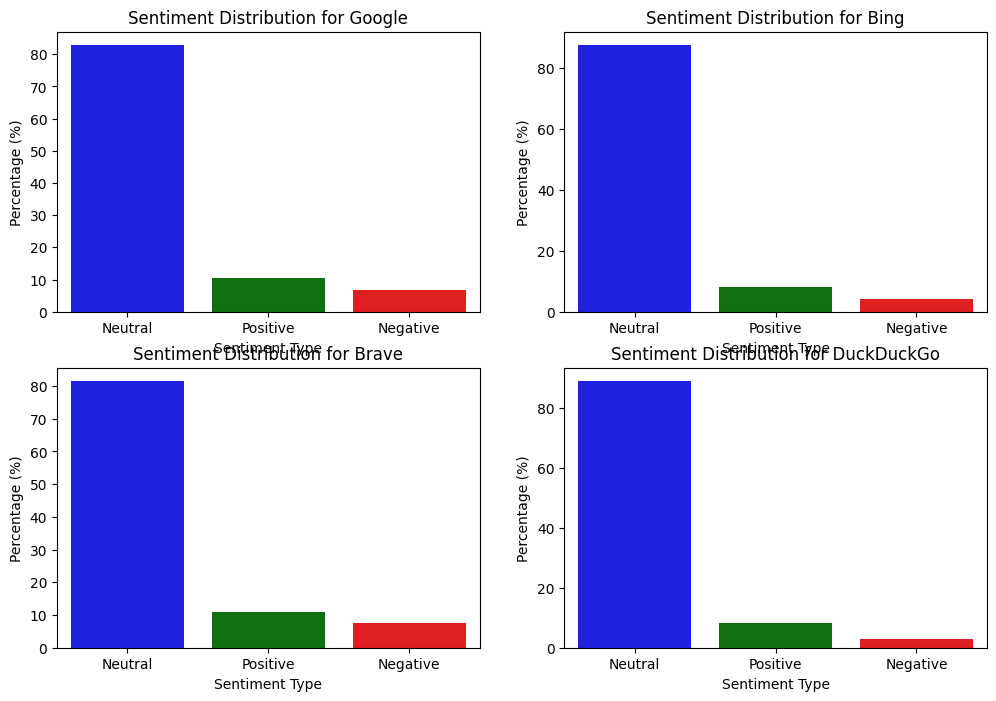

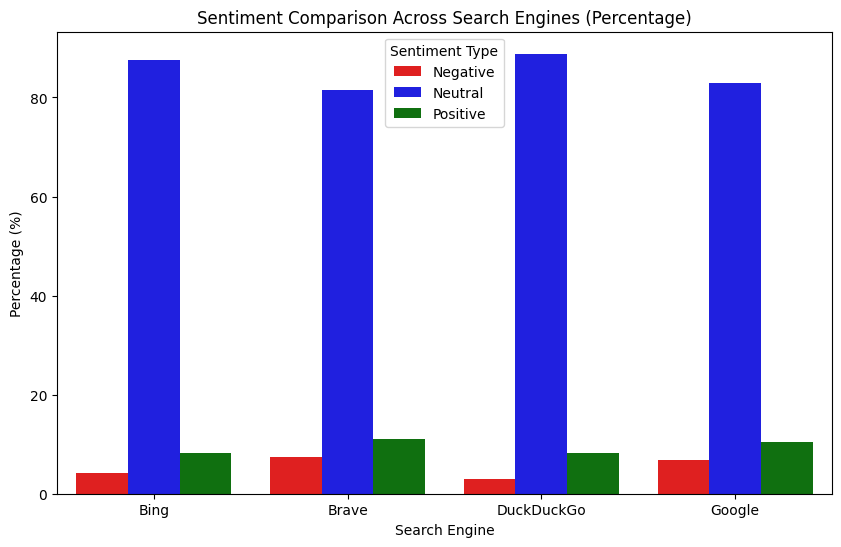

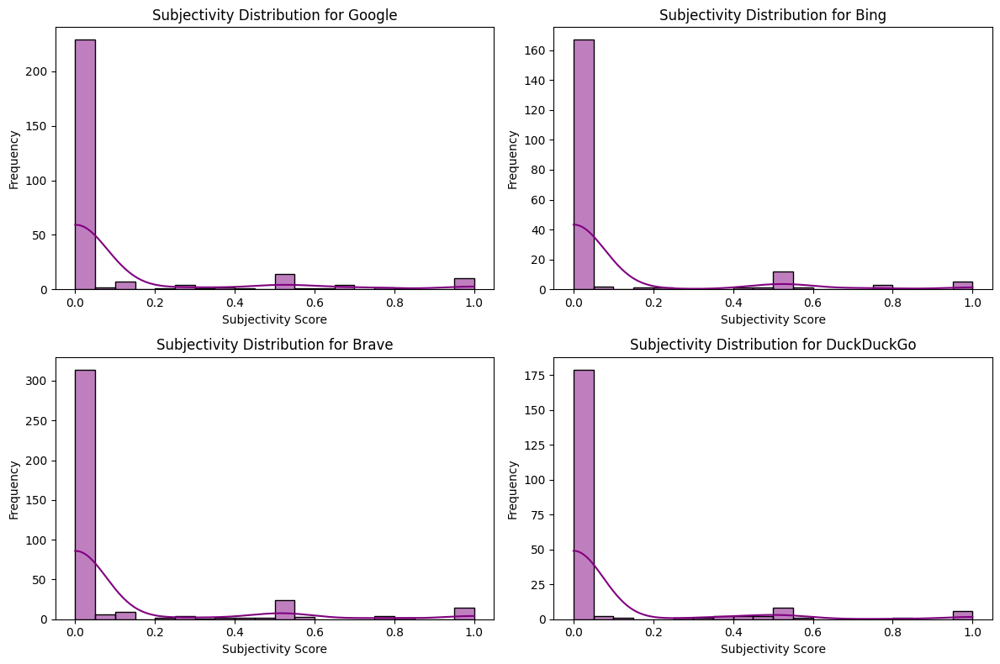

<ipython-input-9-bb589b508a7c>:94: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Search Engine", y="Subjectivity", data=sentiment_df, palette="coolwarm")


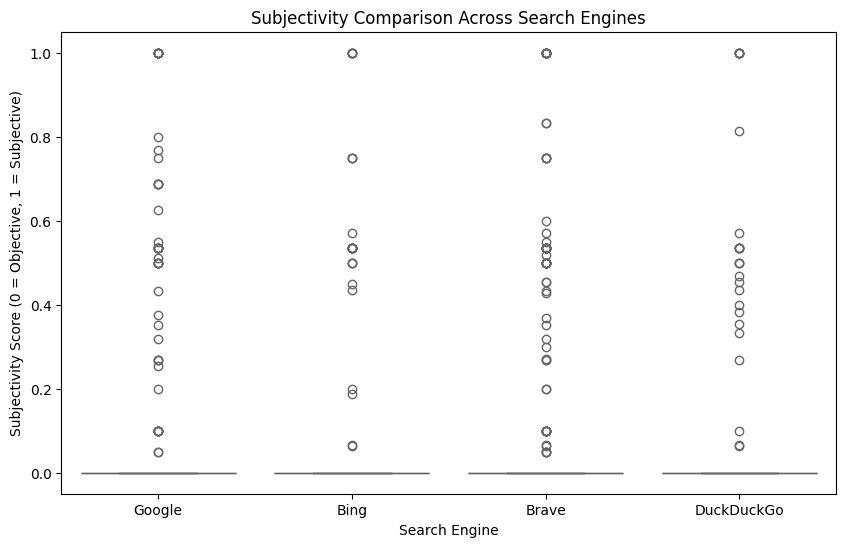

In [ ]:
analyze_sentiment(csv_filename)

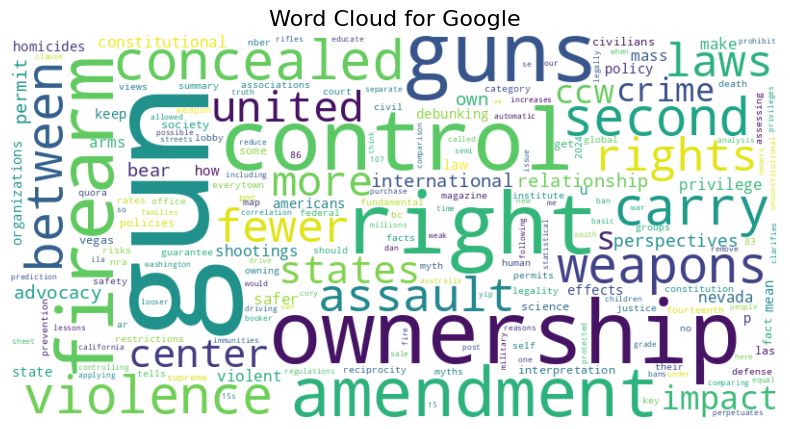

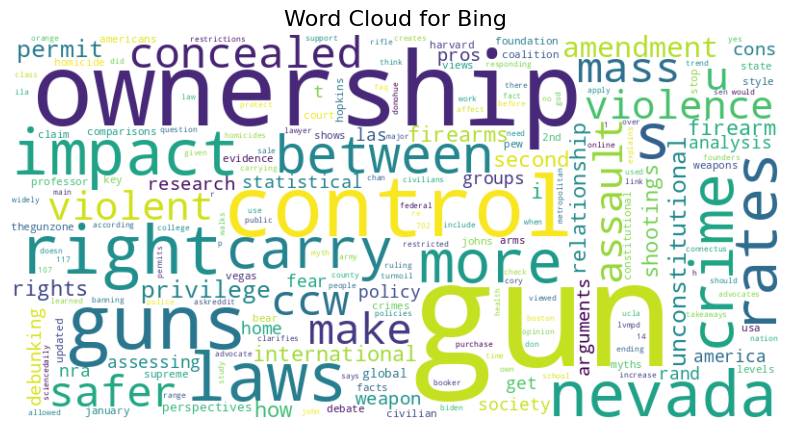

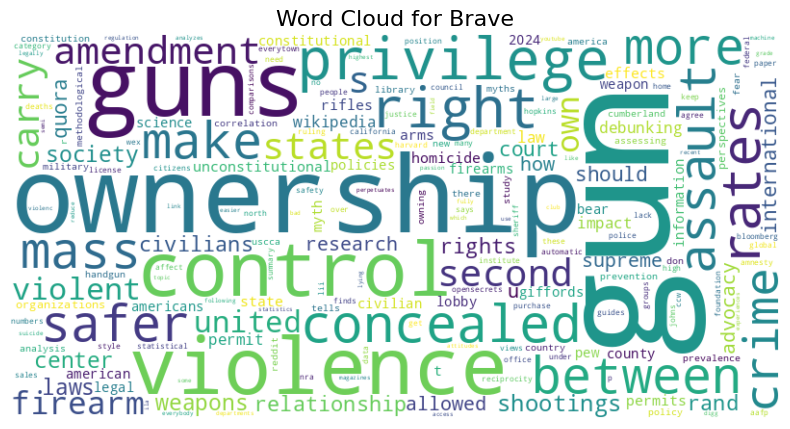

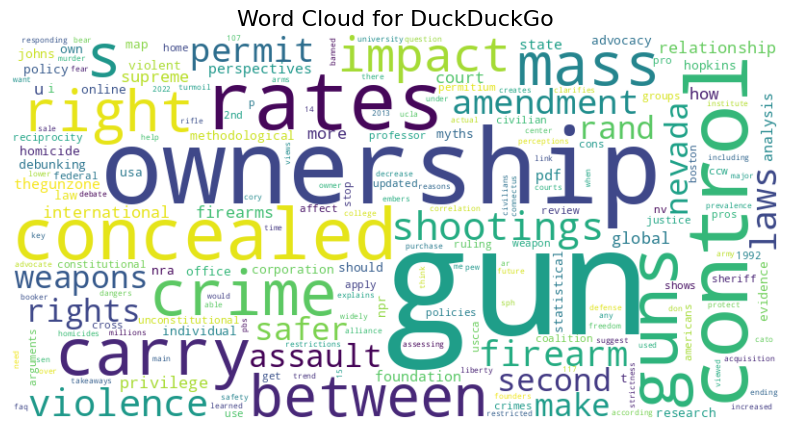

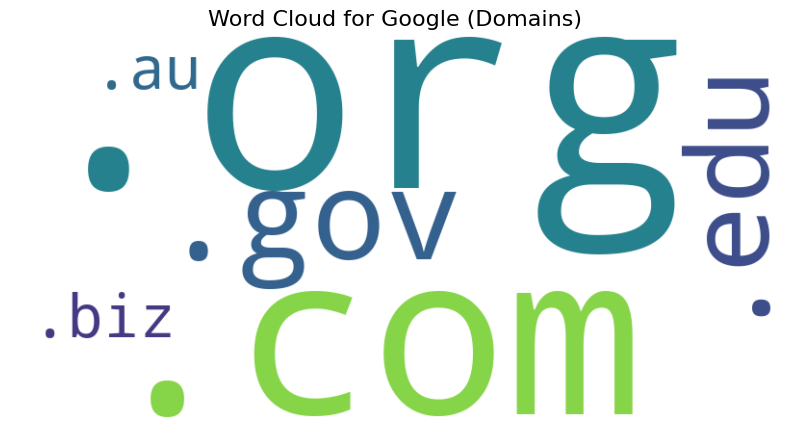

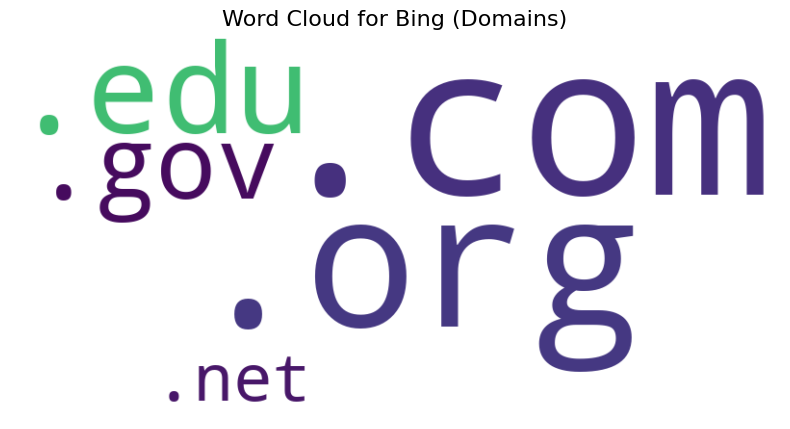

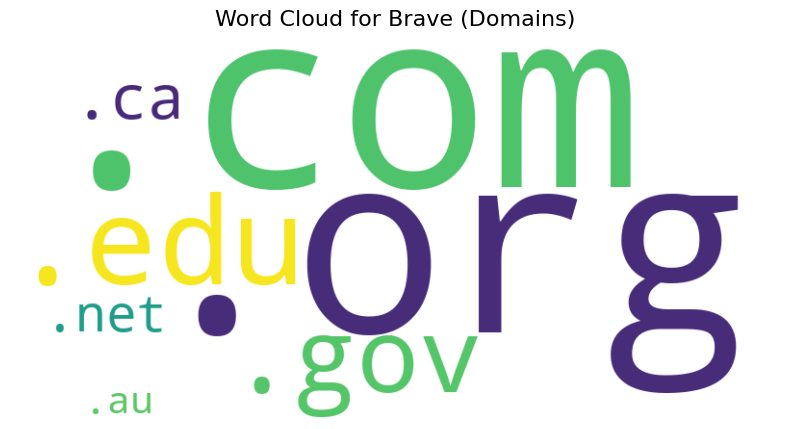

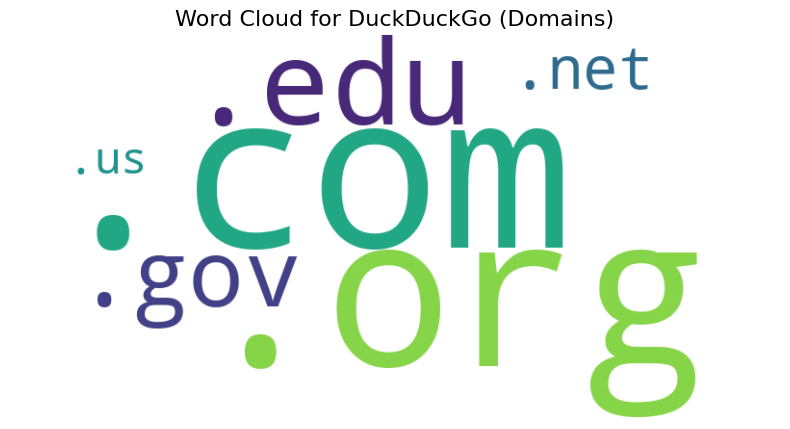

In [ ]:
generate_word_clouds(csv_filename)

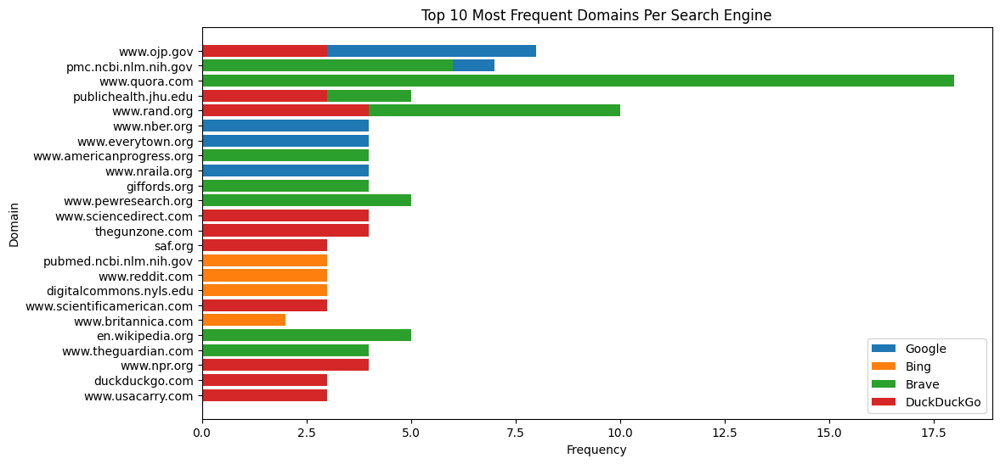

<ipython-input-10-de26791468fb>:45: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  domain_matrix = pd.DataFrame(index=all_domains, columns=domain_data.keys()).fillna(0)


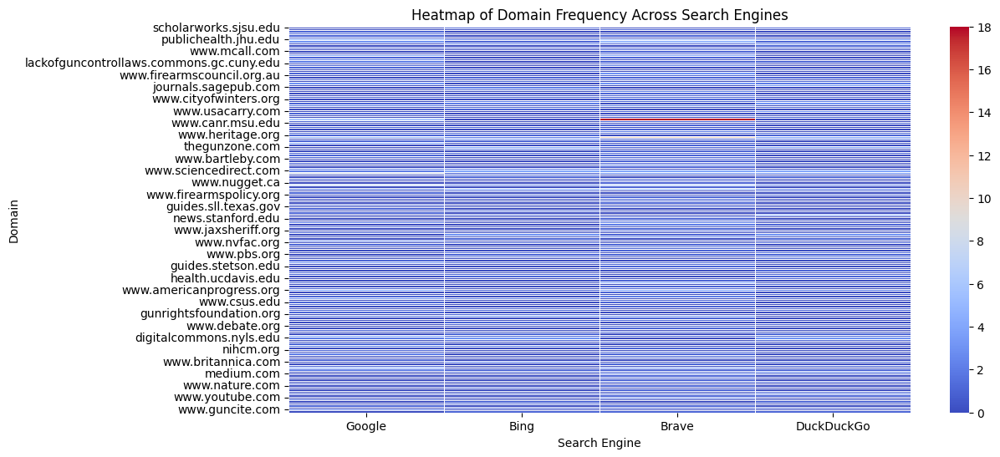

In [ ]:
analyze_domain_diversity("search_results.csv")

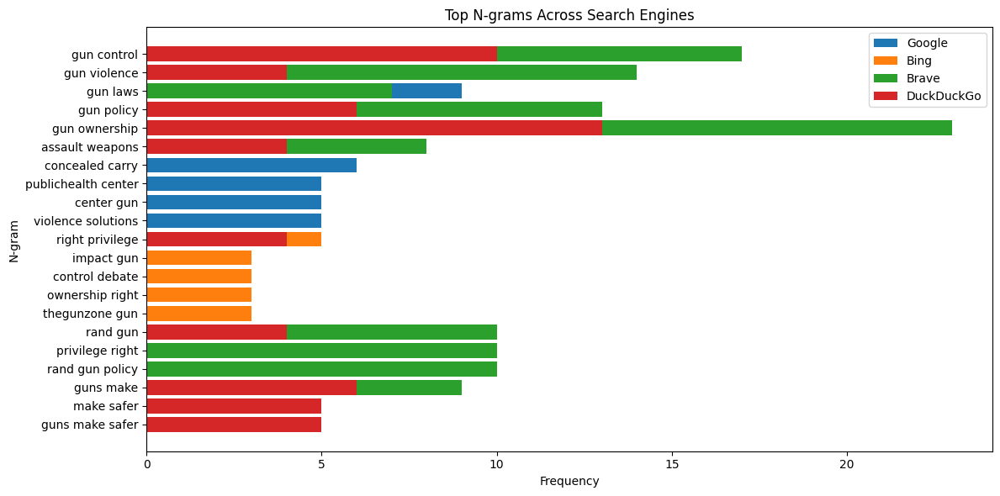

In [ ]:
analyze_keywords('search_results.csv')

### Time of Search for Topic 1

#### Time: 8:00 am

#### Time: 4:00 pm

#### Time: 12:00 am

### Location


In [ ]:
search_engine_urls = {
    "Google": "https://www.google.com/search?q="
}

In [ ]:
save_search_results_to_csv(search_phrases, search_engine_urls, 'google_results.csv', locations)

Google search for 'Does gun ownership increase violence?' in us returned 15 results
Google search for 'Does gun ownership increase violence?' in uk returned 13 results
Google search for 'Does gun ownership increase violence?' in za returned 14 results
Google search for 'Should civilians be allowed to own assault weapons?' in us returned 14 results
Google search for 'Should civilians be allowed to own assault weapons?' in uk returned 15 results
Google search for 'Should civilians be allowed to own assault weapons?' in za returned 13 results
Google search for 'Gun ownership: Right or privilege?' in us returned 15 results
Google search for 'Gun ownership: Right or privilege?' in uk returned 15 results
Google search for 'Gun ownership: Right or privilege?' in za returned 15 results
Google search for 'The link between gun ownership and mass shootings' in us returned 10 results
Google search for 'The link between gun ownership and mass shootings' in uk returned 10 results
Google search for '

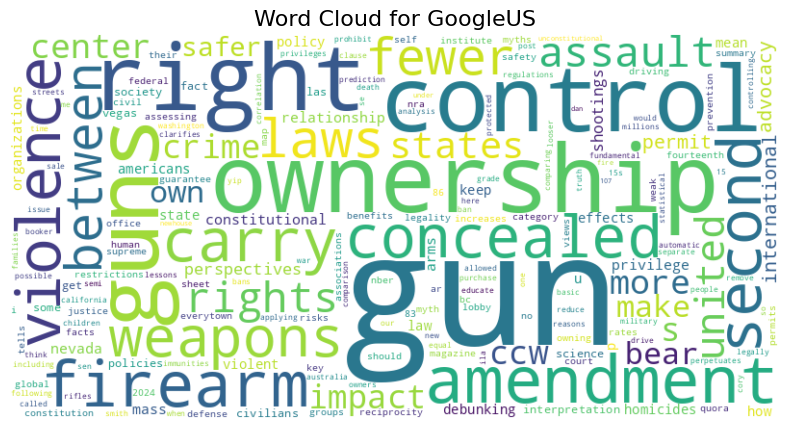

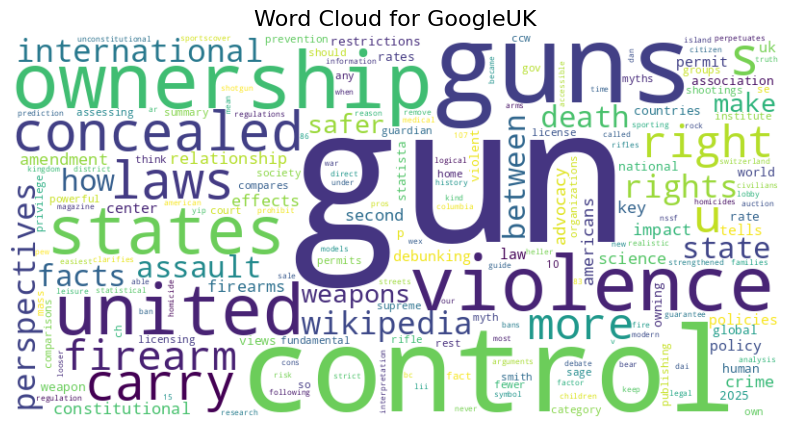

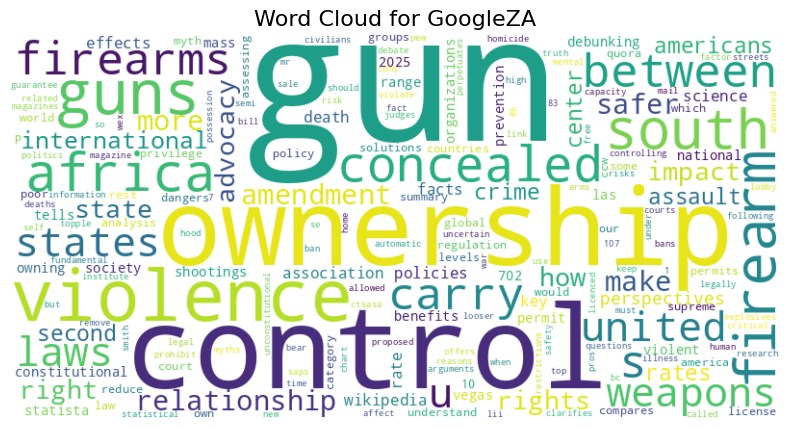

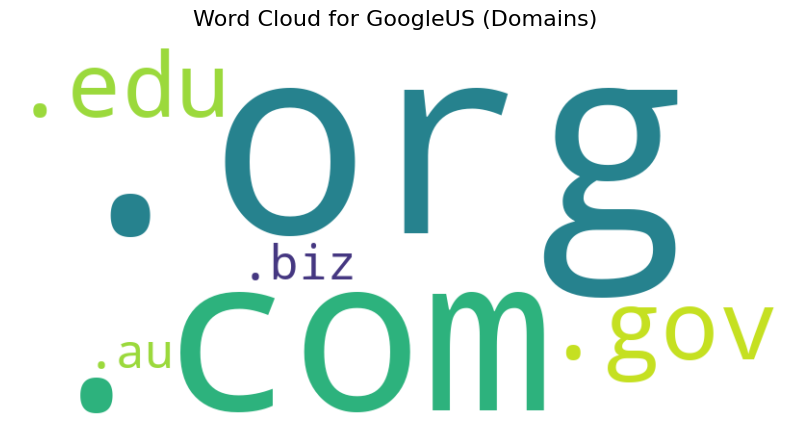

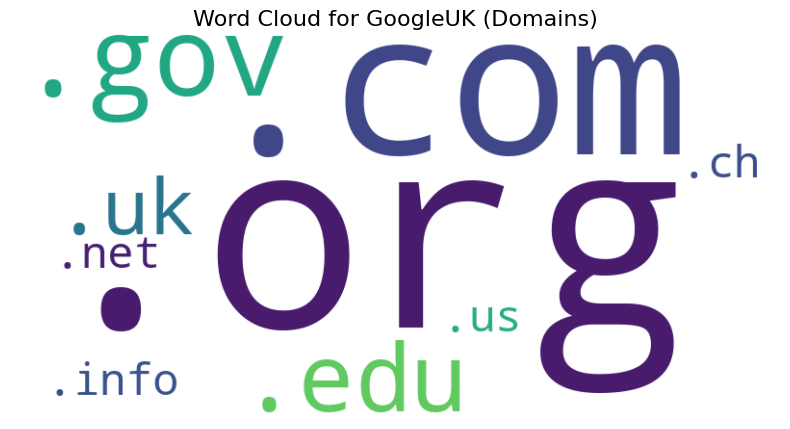

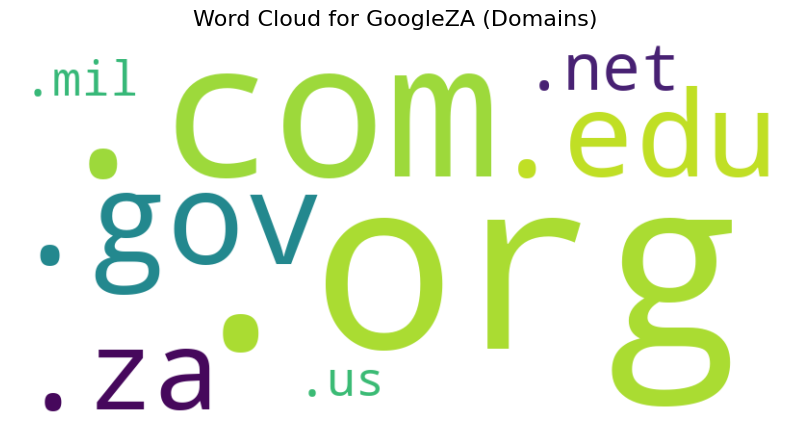

In [ ]:
generate_word_clouds('google_results.csv')

Sentiment analysis results saved to sentiment_analysis_results.csv


<ipython-input-9-bb589b508a7c>:55: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=sentiment_counts.index, y=sentiment_counts.values,
<ipython-input-9-bb589b508a7c>:55: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=sentiment_counts.index, y=sentiment_counts.values,
<ipython-input-9-bb589b508a7c>:55: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=sentiment_counts.index, y=sentiment_counts.values,


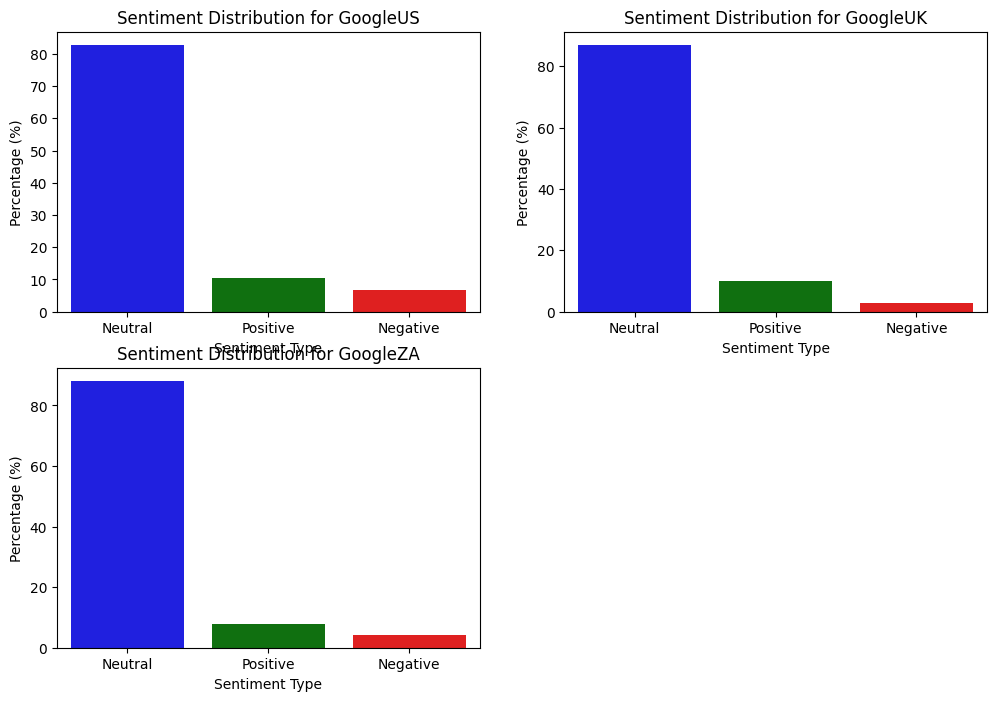

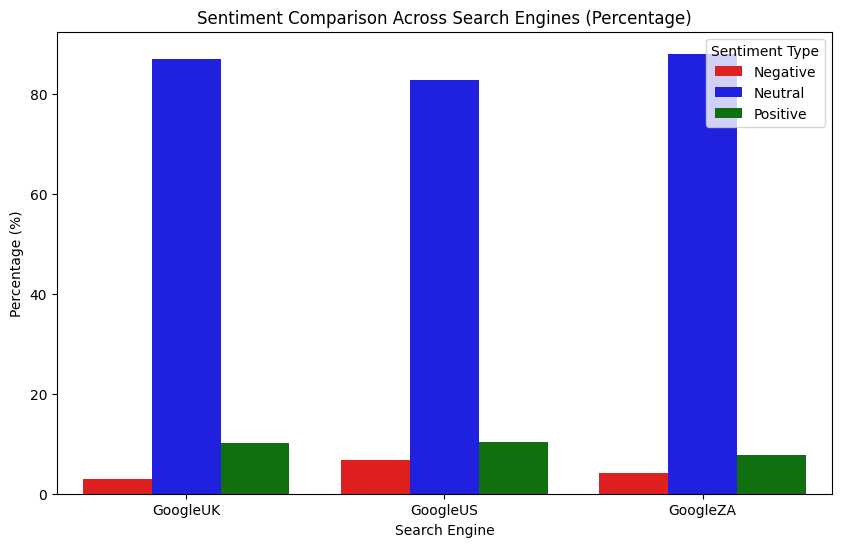

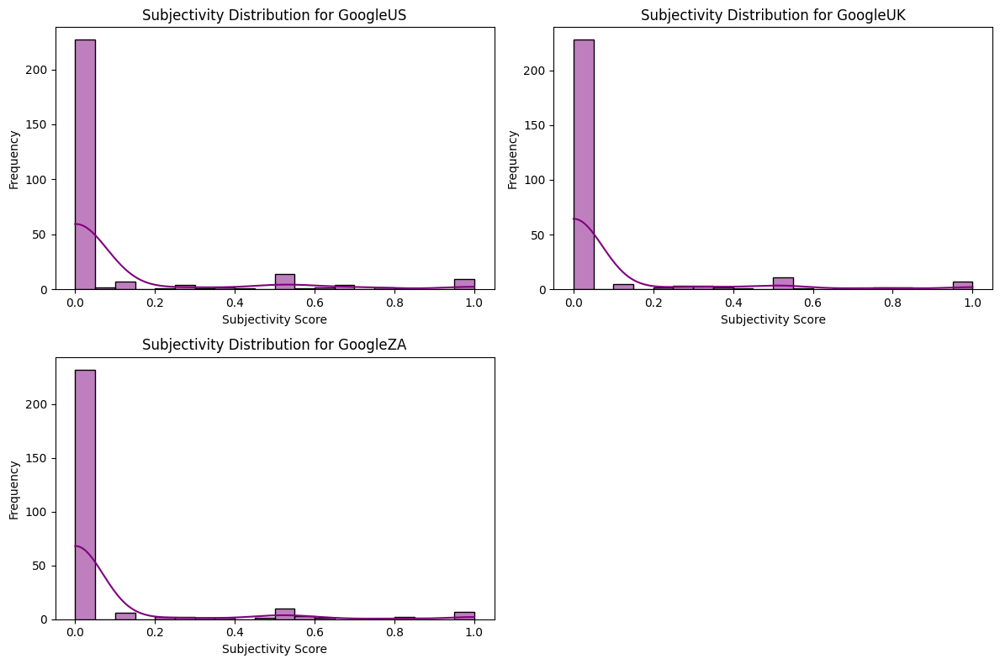

<ipython-input-9-bb589b508a7c>:94: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Search Engine", y="Subjectivity", data=sentiment_df, palette="coolwarm")


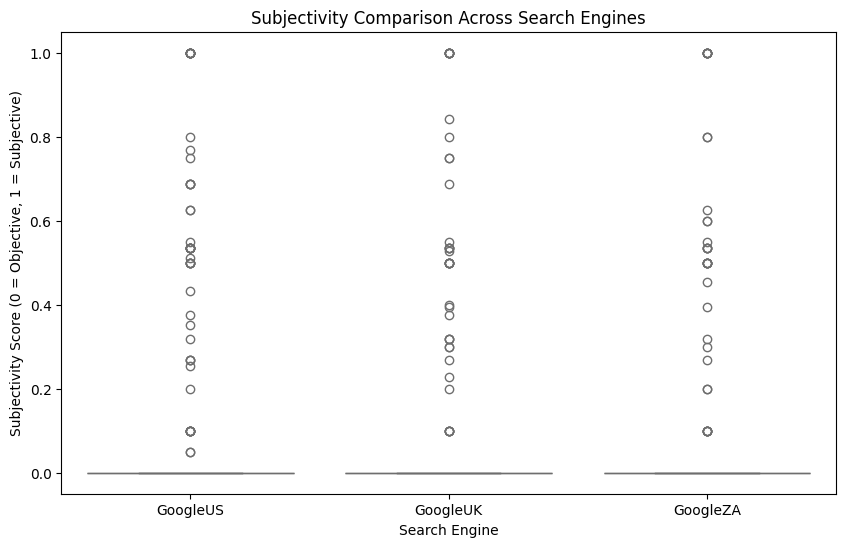

In [ ]:
analyze_sentiment('google_results.csv')

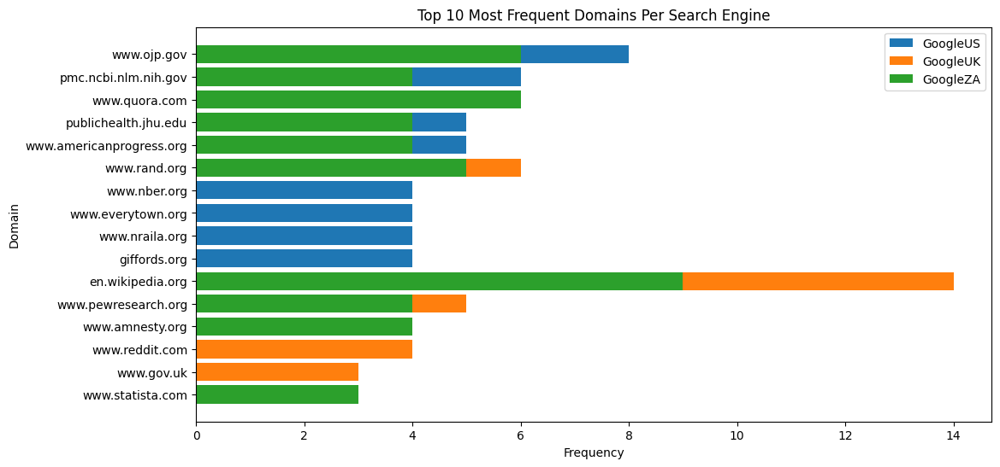

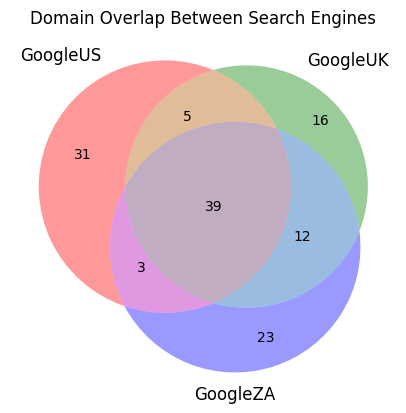

<ipython-input-10-de26791468fb>:45: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  domain_matrix = pd.DataFrame(index=all_domains, columns=domain_data.keys()).fillna(0)


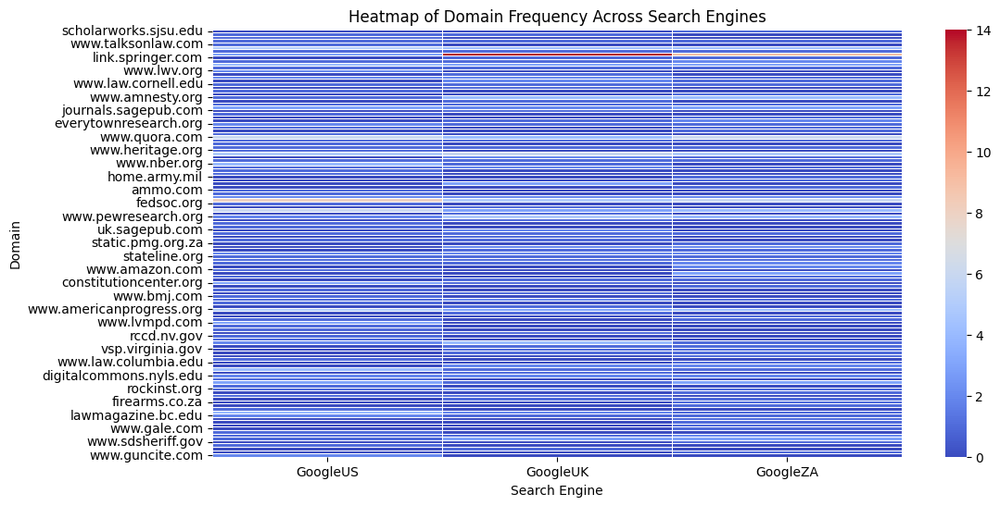

In [ ]:
analyze_domain_diversity('google_results.csv')

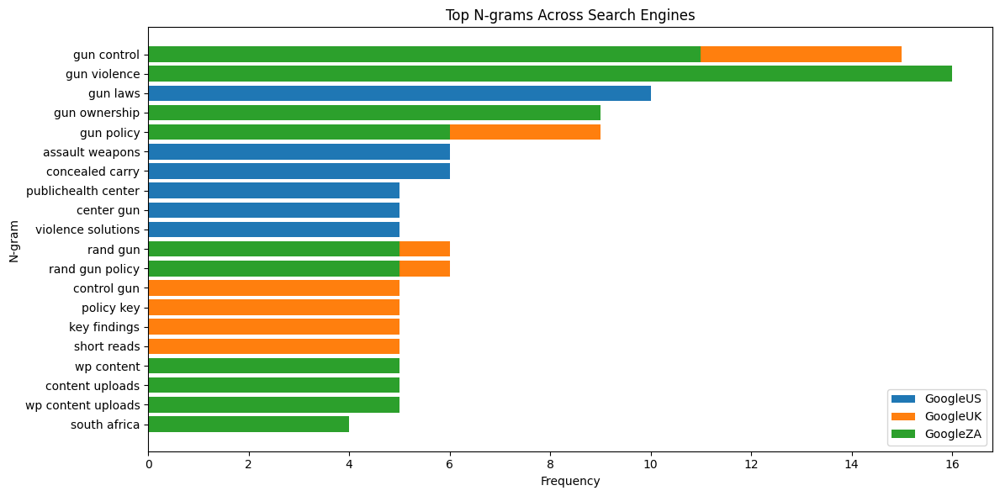

In [ ]:
analyze_keywords('google_results.csv')

# Topic 2: LGBTQ+

In [ ]:
search_phrases = ["Importance of LGBTQ+ rights",
                  "Legal protections for LGBTQ+ individuals",
                  "History of LGBTQ+ movements",
                  "LGBTQ+ equality in the workplace",
                  "Same-sex marriage legal battles",
                  "Transgender rights and healthcare access",
                  "Religious views on LGBTQ+ rights",
                  "LGBTQ+ representation in media",
                  "Conversion therapy bans",
                  "LGBTQ+ workplace equality"]

search_engine_urls = {
    "Google": "https://www.google.com/search?q=",
    "Bing": "https://www.bing.com/search?q=",
    "Brave": "https://search.brave.com/search?q=",
    "DuckDuckGo": "https://duckduckgo.com/?q="
}

In [ ]:
save_to_csv(search_phrases, search_engine_urls, 'search_results_2.csv')
# Run the function on your CSV file
csv_filename = "search_results_2.csv"

Google search for 'Importance of LGBTQ+ rights' returned 13 results
Bing search for 'Importance of LGBTQ+ rights' returned 10 results
Brave search for 'Importance of LGBTQ+ rights' returned 20 results
DuckDuckGo search for 'Importance of LGBTQ+ rights' returned 10 results
Google search for 'Legal protections for LGBTQ+ individuals' returned 14 results
Bing search for 'Legal protections for LGBTQ+ individuals' returned 10 results
Brave search for 'Legal protections for LGBTQ+ individuals' returned 20 results
DuckDuckGo search for 'Legal protections for LGBTQ+ individuals' returned 10 results
Google search for 'History of LGBTQ+ movements' returned 13 results
Bing search for 'History of LGBTQ+ movements' returned 10 results
Brave search for 'History of LGBTQ+ movements' returned 20 results
DuckDuckGo search for 'History of LGBTQ+ movements' returned 11 results
Google search for 'LGBTQ+ equality in the workplace' returned 13 results
Bing search for 'LGBTQ+ equality in the workplace' retur

Sentiment analysis results saved to sentiment_analysis_results.csv


<ipython-input-9-bb589b508a7c>:55: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=sentiment_counts.index, y=sentiment_counts.values,
<ipython-input-9-bb589b508a7c>:55: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=sentiment_counts.index, y=sentiment_counts.values,
<ipython-input-9-bb589b508a7c>:55: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=sentiment_counts.index, y=sentiment_counts.values,
<ipython-input-9-bb589b508a7c>:55: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assig

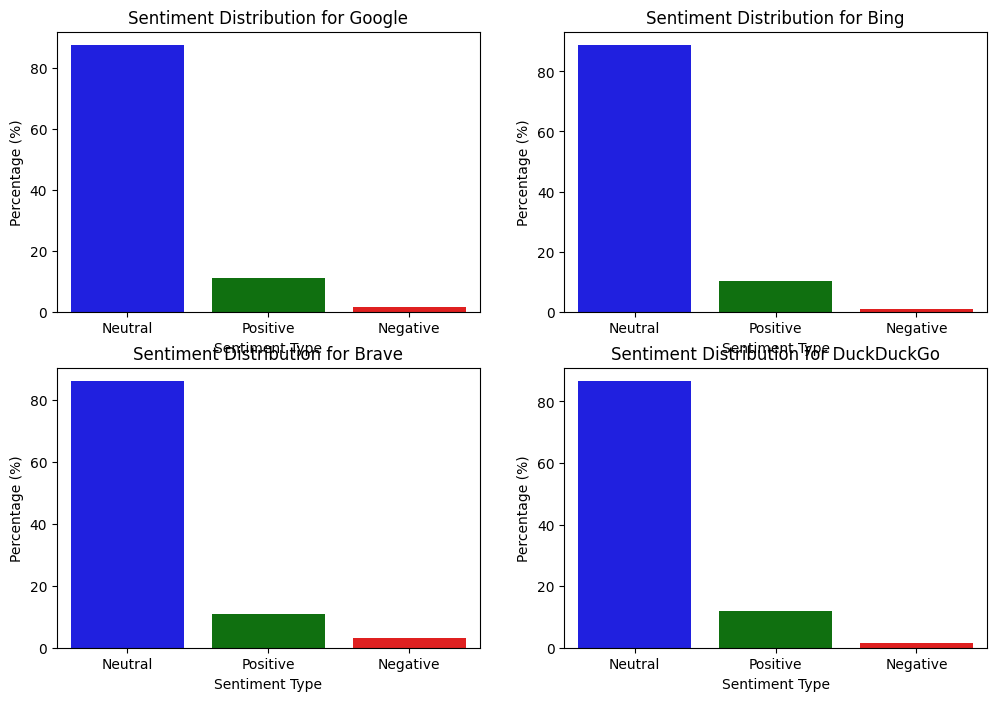

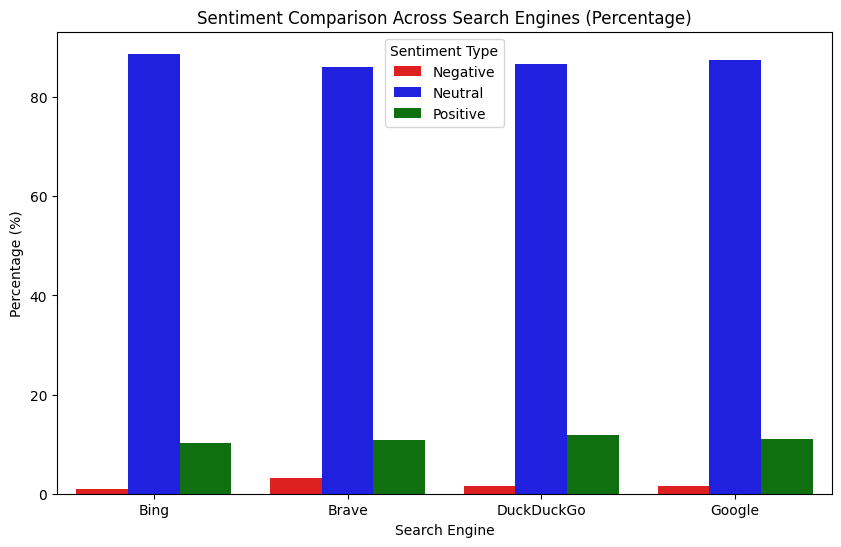

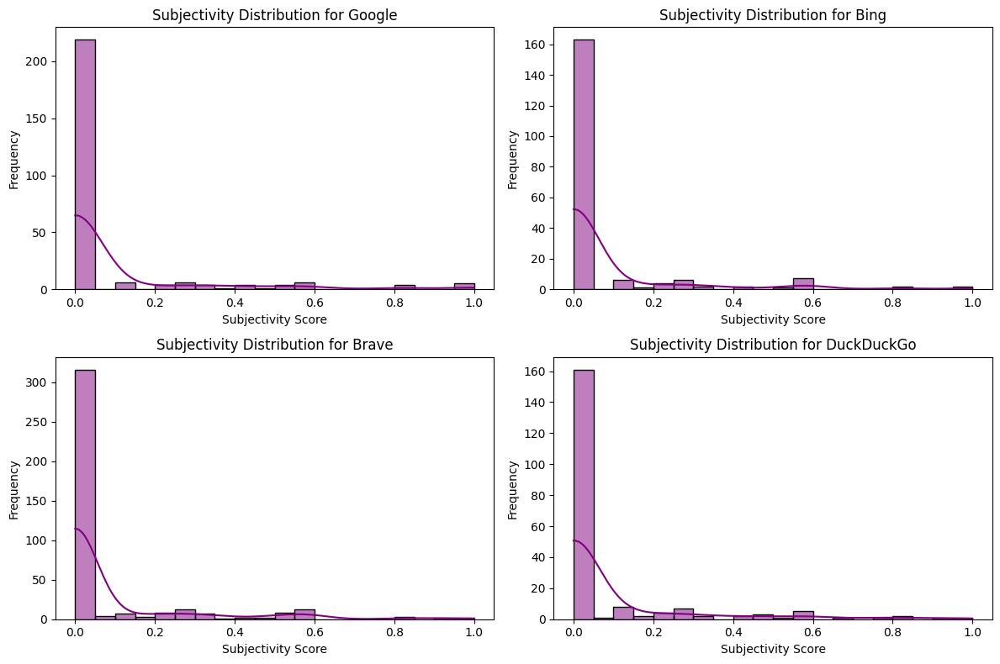

<ipython-input-9-bb589b508a7c>:94: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Search Engine", y="Subjectivity", data=sentiment_df, palette="coolwarm")


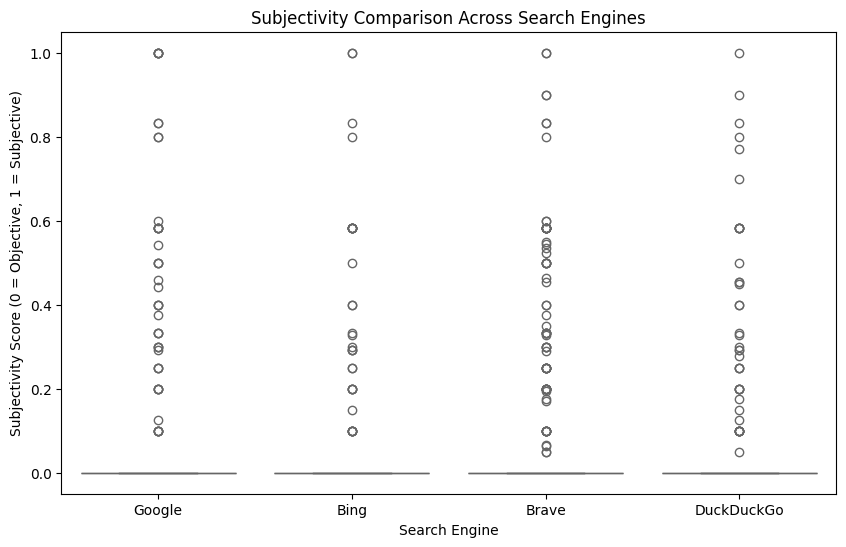

In [ ]:
analyze_sentiment(csv_filename)

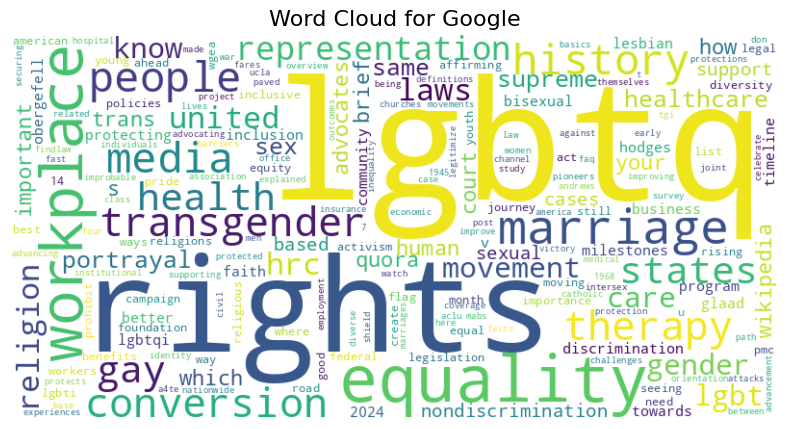

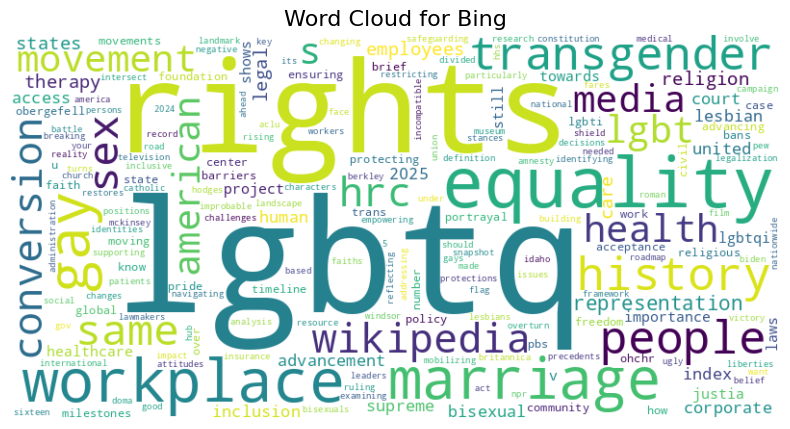

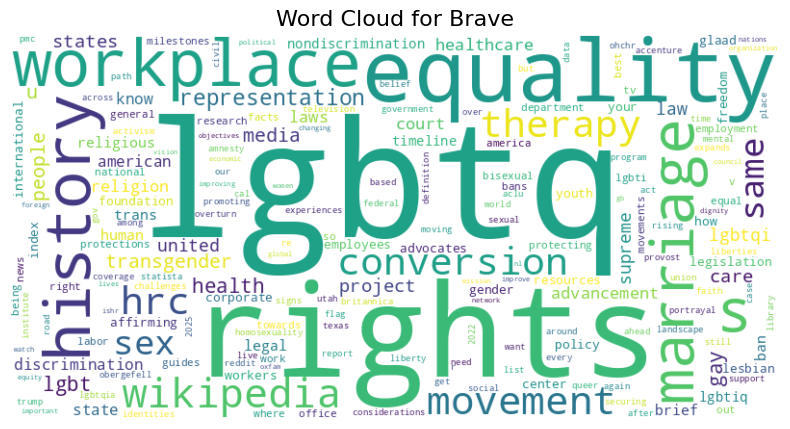

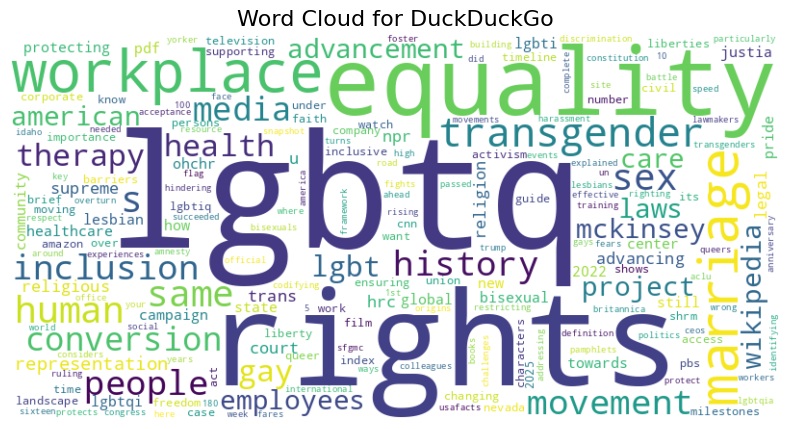

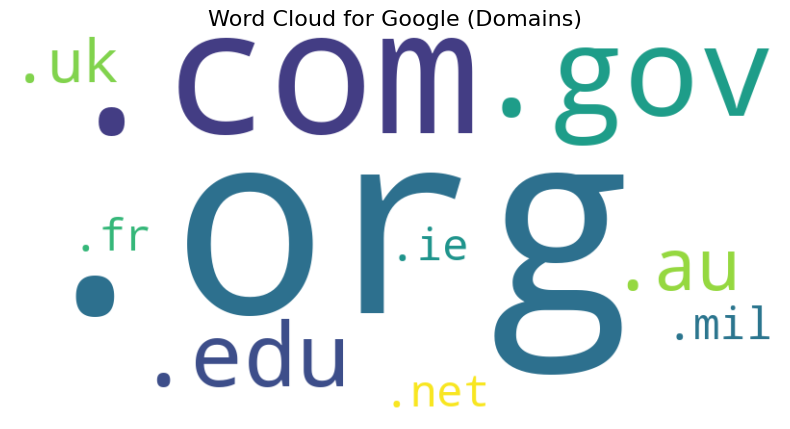

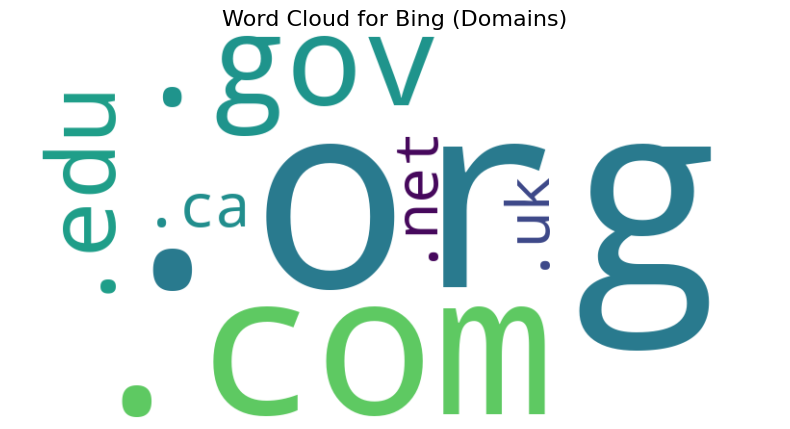

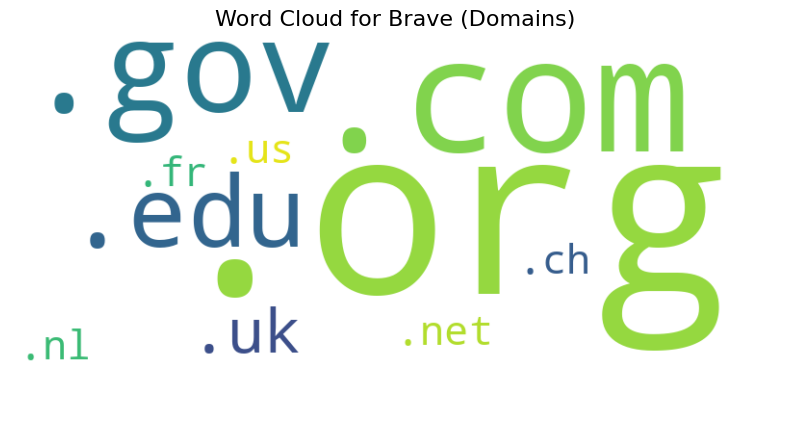

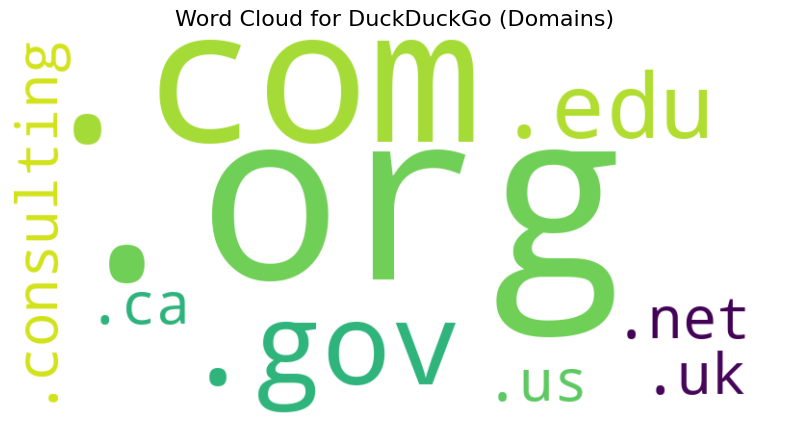

In [ ]:
generate_word_clouds(csv_filename)

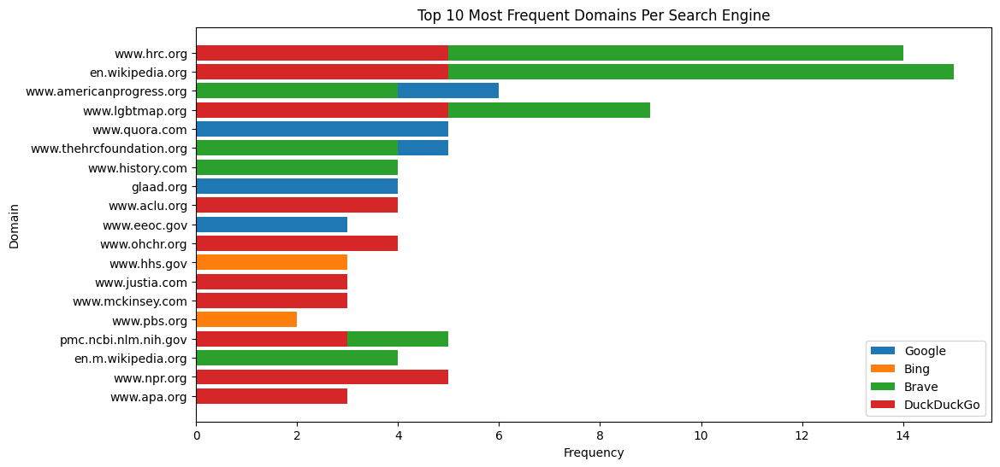

<ipython-input-10-de26791468fb>:45: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  domain_matrix = pd.DataFrame(index=all_domains, columns=domain_data.keys()).fillna(0)


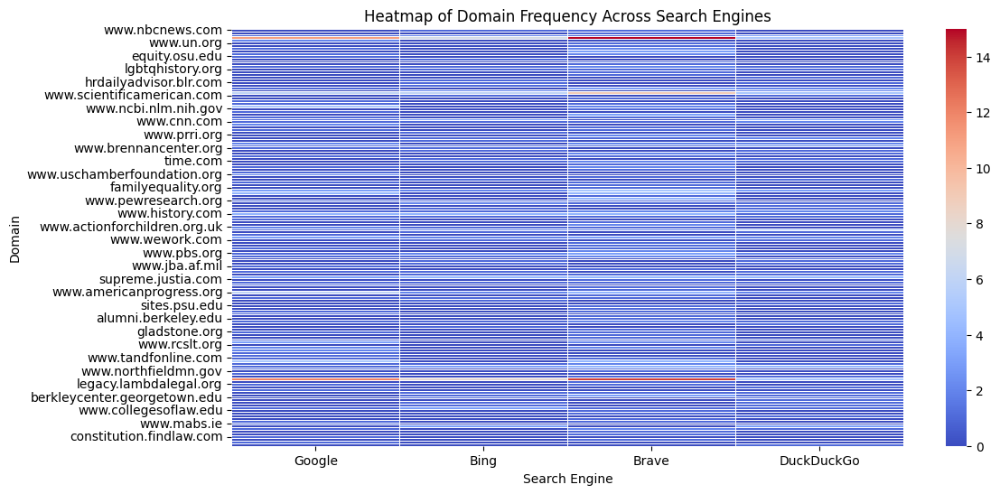

In [ ]:
analyze_domain_diversity("search_results_2.csv")

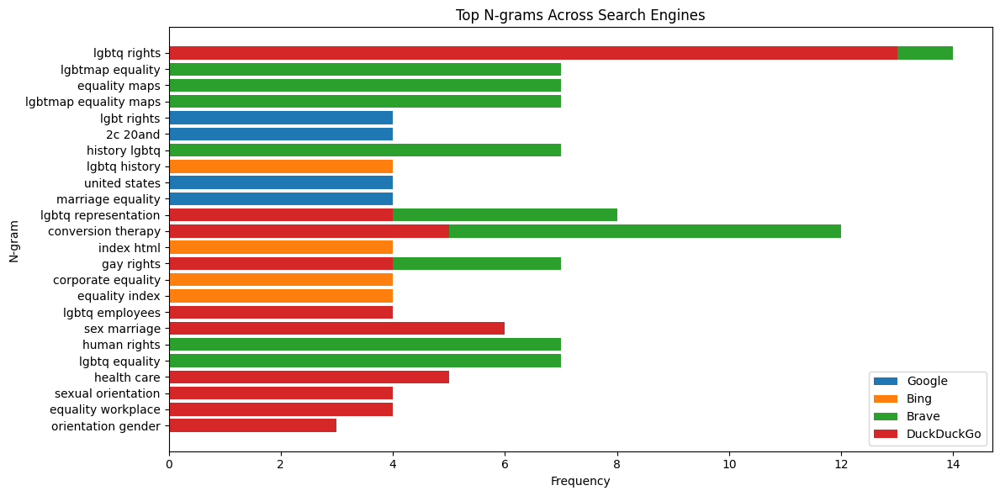

In [ ]:
analyze_keywords('search_results_2.csv')

### Time of Search for Topic 1

#### Time: 8:00 am

#### Time: 4:00 pm

#### Time: 12:00 am

### Location


In [ ]:
search_engine_urls = {
    "Google": "https://www.google.com/search?q="
}

In [ ]:
save_search_results_to_csv(search_phrases, search_engine_urls, 'google_results_2.csv', locations)

Google search for 'Importance of LGBTQ+ rights' in us returned 13 results
Google search for 'Importance of LGBTQ+ rights' in uk returned 14 results
Google search for 'Importance of LGBTQ+ rights' in za returned 14 results
Google search for 'Legal protections for LGBTQ+ individuals' in us returned 13 results
Google search for 'Legal protections for LGBTQ+ individuals' in uk returned 14 results
Google search for 'Legal protections for LGBTQ+ individuals' in za returned 14 results
Google search for 'History of LGBTQ+ movements' in us returned 13 results
Google search for 'History of LGBTQ+ movements' in uk returned 14 results
Google search for 'History of LGBTQ+ movements' in za returned 13 results
Google search for 'LGBTQ+ equality in the workplace' in us returned 14 results
Google search for 'LGBTQ+ equality in the workplace' in uk returned 15 results
Google search for 'LGBTQ+ equality in the workplace' in za returned 13 results
Google search for 'Same-sex marriage legal battles' in us 

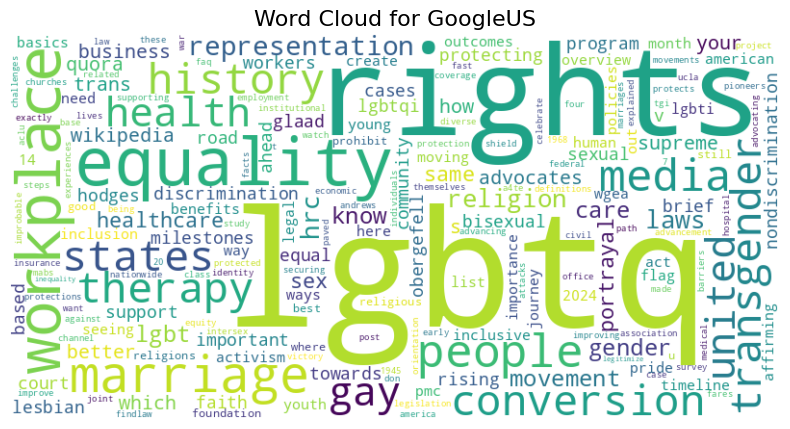

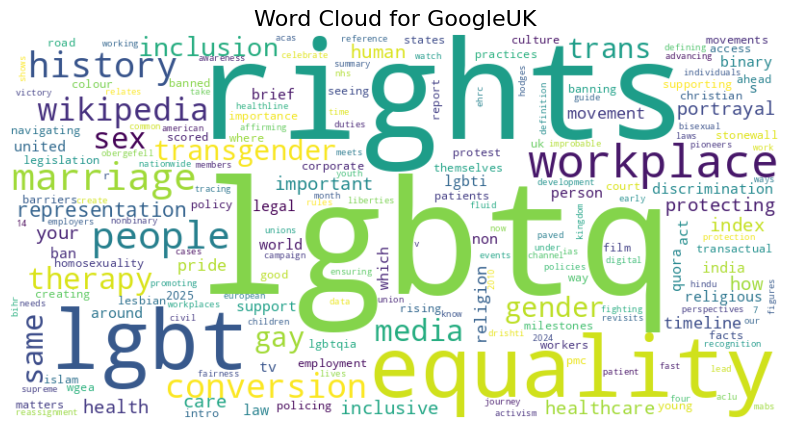

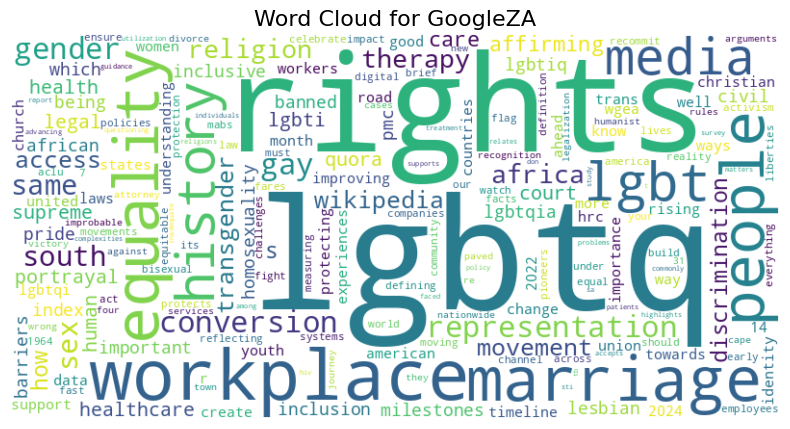

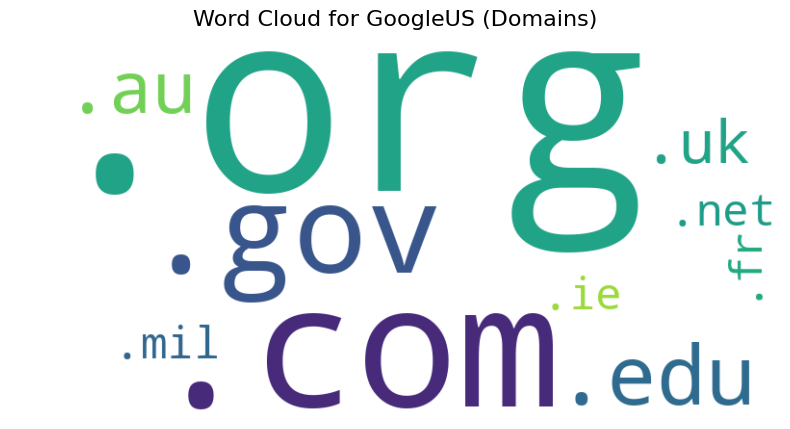

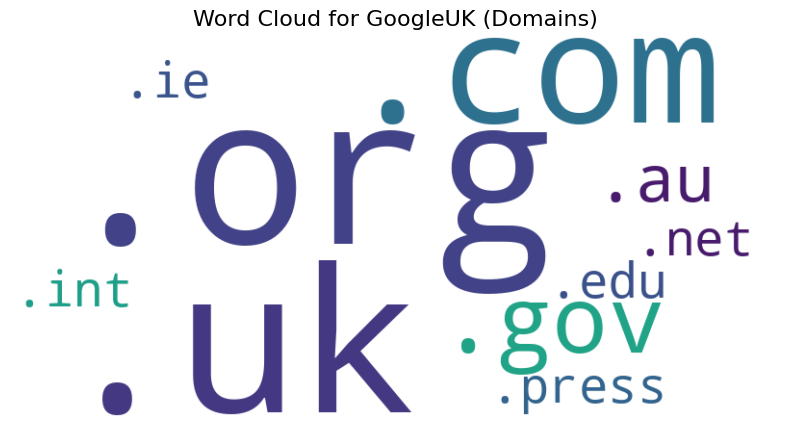

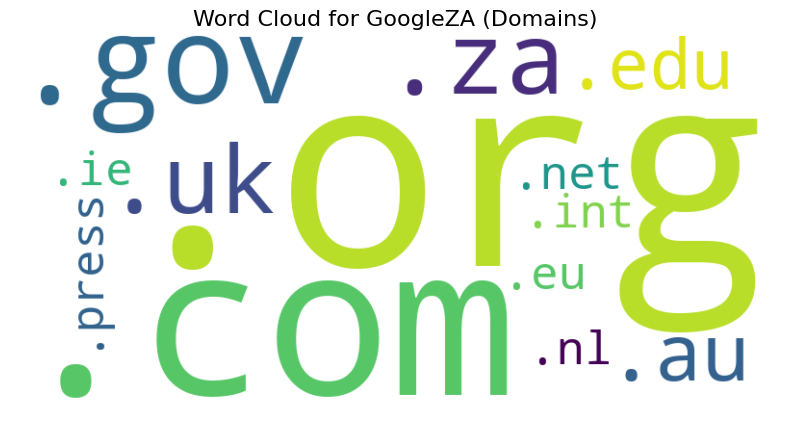

In [ ]:
generate_word_clouds('google_results_2.csv')

Sentiment analysis results saved to sentiment_analysis_results.csv


<ipython-input-9-bb589b508a7c>:55: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=sentiment_counts.index, y=sentiment_counts.values,
<ipython-input-9-bb589b508a7c>:55: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=sentiment_counts.index, y=sentiment_counts.values,
<ipython-input-9-bb589b508a7c>:55: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=sentiment_counts.index, y=sentiment_counts.values,


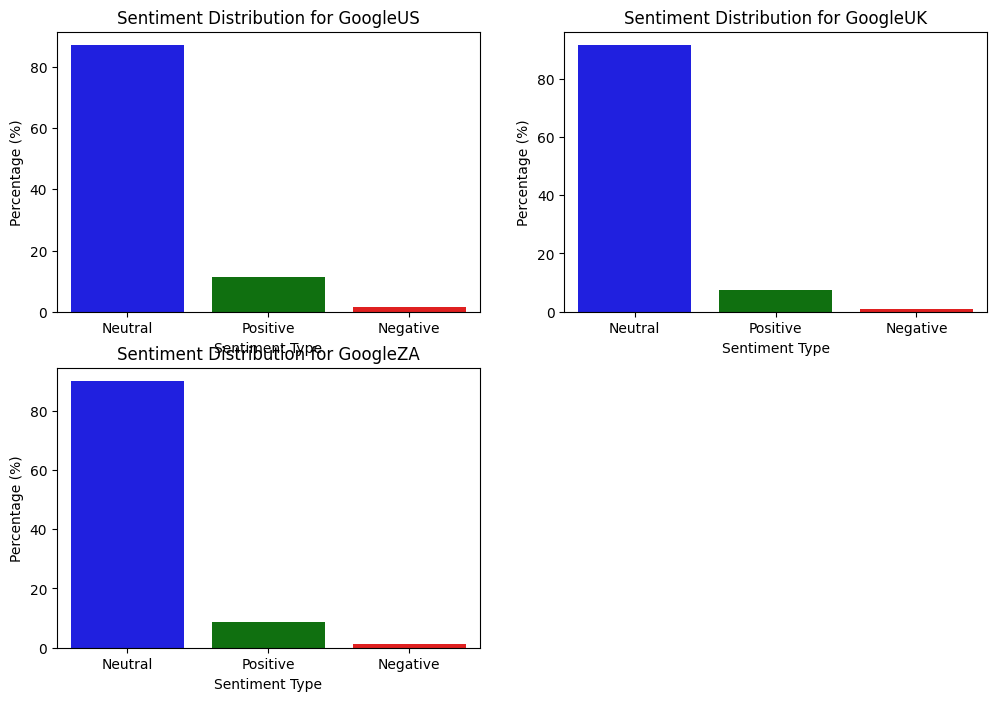

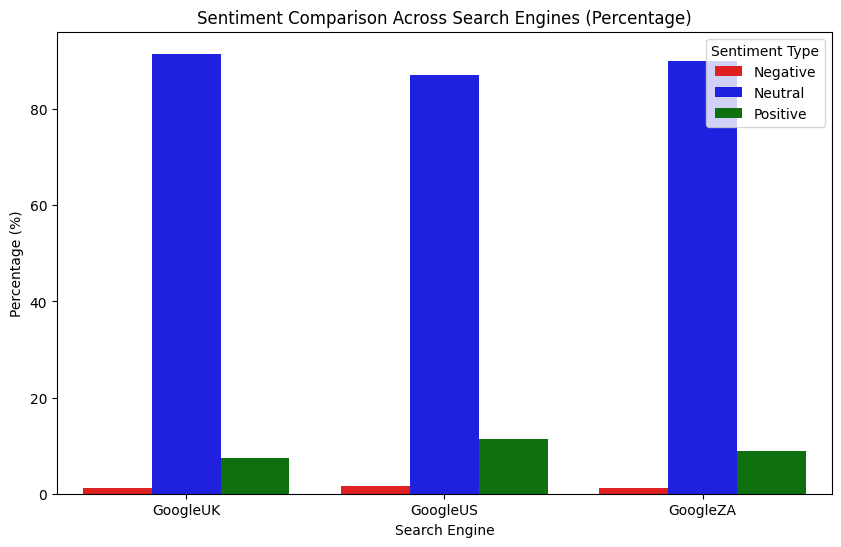

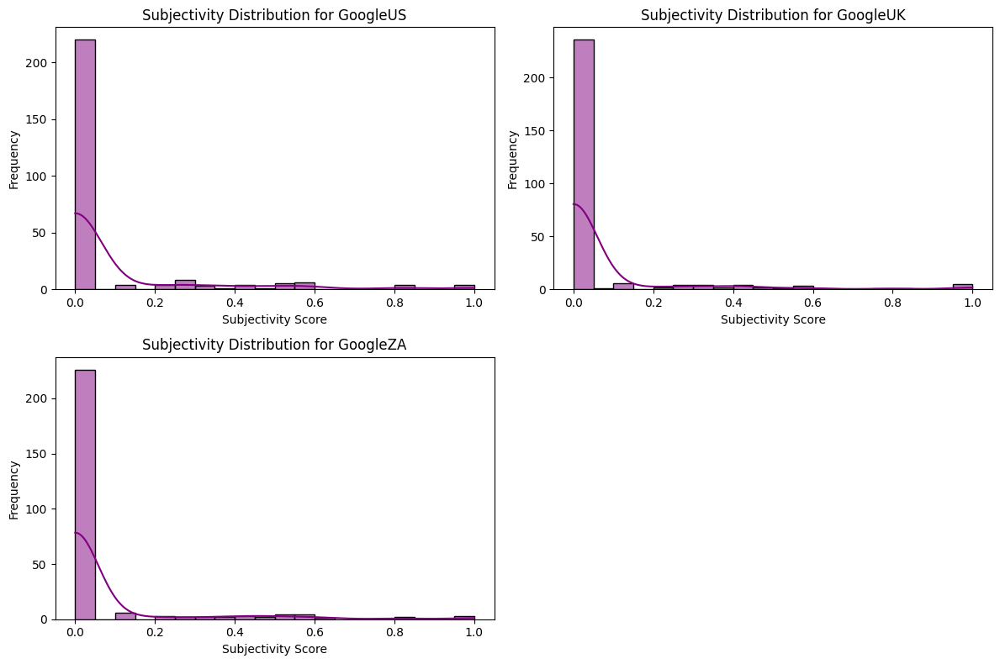

<ipython-input-9-bb589b508a7c>:94: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Search Engine", y="Subjectivity", data=sentiment_df, palette="coolwarm")


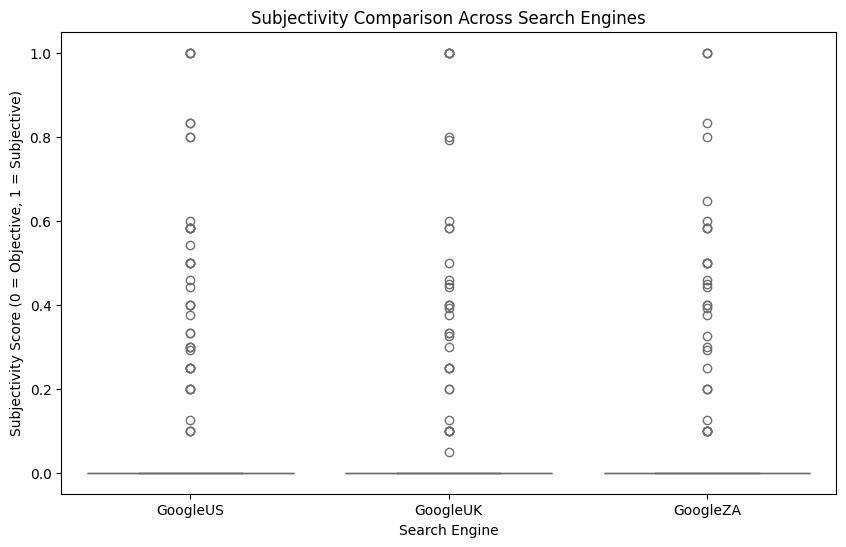

In [ ]:
analyze_sentiment('google_results_2.csv')

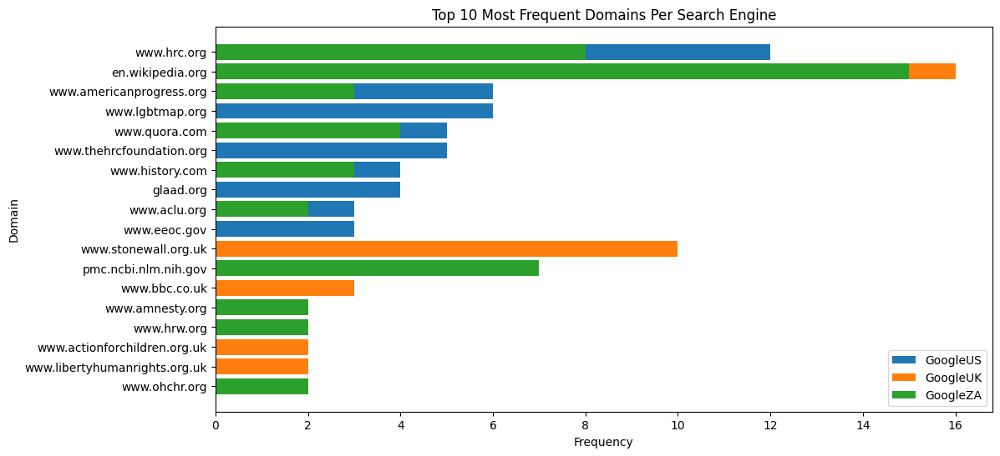

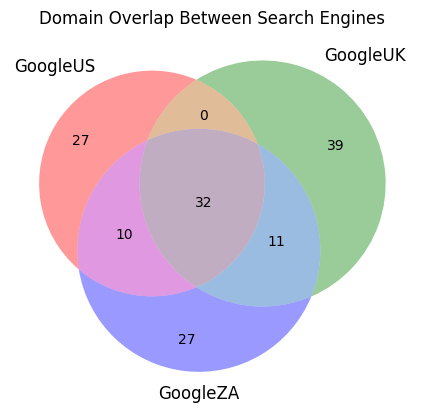

<ipython-input-10-de26791468fb>:45: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  domain_matrix = pd.DataFrame(index=all_domains, columns=domain_data.keys()).fillna(0)


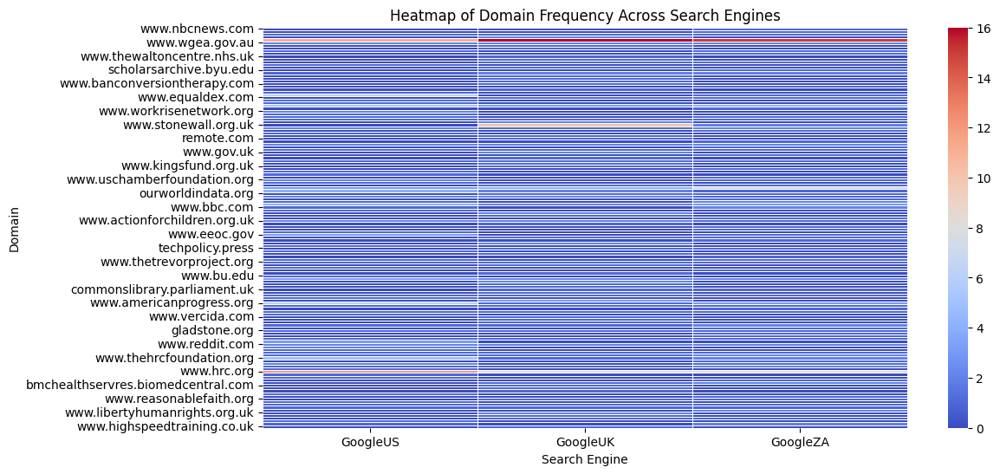

In [ ]:
analyze_domain_diversity('google_results_2.csv')

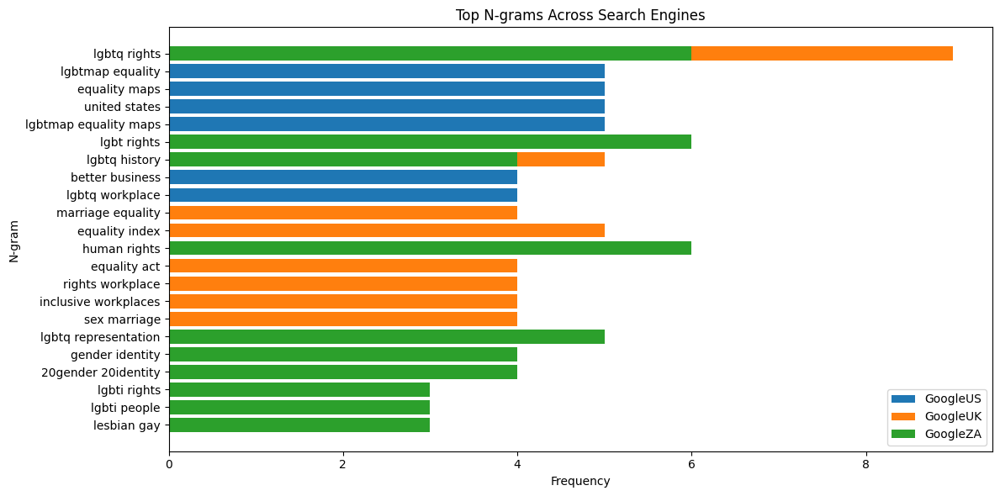

In [ ]:
analyze_keywords('google_results_2.csv')

# Topic 3: Abortion laws

In [ ]:
search_phrases = ["Abortion laws",
                  "Should it be legal to abort",
                  "Early abortion",
                  "Reproductive rights activism",
                  "Public opinion and abortion laws",
                  "Abortion bans and women’s health",
                  "Abortion health risks",
                  "Pro-life vs pro-choice debate",
                  "Religious views on abortion",
                  "Abortion access during COVID-19"
                  ]

search_engine_urls = {
    "Google": "https://www.google.com/search?q=",
    "Bing": "https://www.bing.com/search?q=",
    "Brave": "https://search.brave.com/search?q=",
    "DuckDuckGo": "https://duckduckgo.com/?q="
}

In [ ]:
save_to_csv(search_phrases, search_engine_urls, 'search_results_3.csv')
# Run the function on your CSV file
csv_filename = "search_results_3.csv"

Google search for 'Abortion laws' returned 10 results
Bing search for 'Abortion laws' returned 10 results
Brave search for 'Abortion laws' returned 19 results
DuckDuckGo search for 'Abortion laws' returned 11 results
Google search for 'Should it be legal to abort' returned 11 results
Bing search for 'Should it be legal to abort' returned 10 results
Brave search for 'Should it be legal to abort' returned 20 results
DuckDuckGo search for 'Should it be legal to abort' returned 11 results
Google search for 'Early abortion' returned 13 results
Bing search for 'Early abortion' returned 9 results
Brave search for 'Early abortion' returned 20 results
DuckDuckGo search for 'Early abortion' returned 11 results
Google search for 'Reproductive rights activism' returned 14 results
Bing search for 'Reproductive rights activism' returned 5 results
Brave search for 'Reproductive rights activism' returned 19 results
DuckDuckGo search for 'Reproductive rights activism' returned 10 results
Google search 

Sentiment analysis results saved to sentiment_analysis_results.csv


<ipython-input-9-bb589b508a7c>:55: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=sentiment_counts.index, y=sentiment_counts.values,
<ipython-input-9-bb589b508a7c>:55: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=sentiment_counts.index, y=sentiment_counts.values,
<ipython-input-9-bb589b508a7c>:55: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=sentiment_counts.index, y=sentiment_counts.values,
<ipython-input-9-bb589b508a7c>:55: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assig

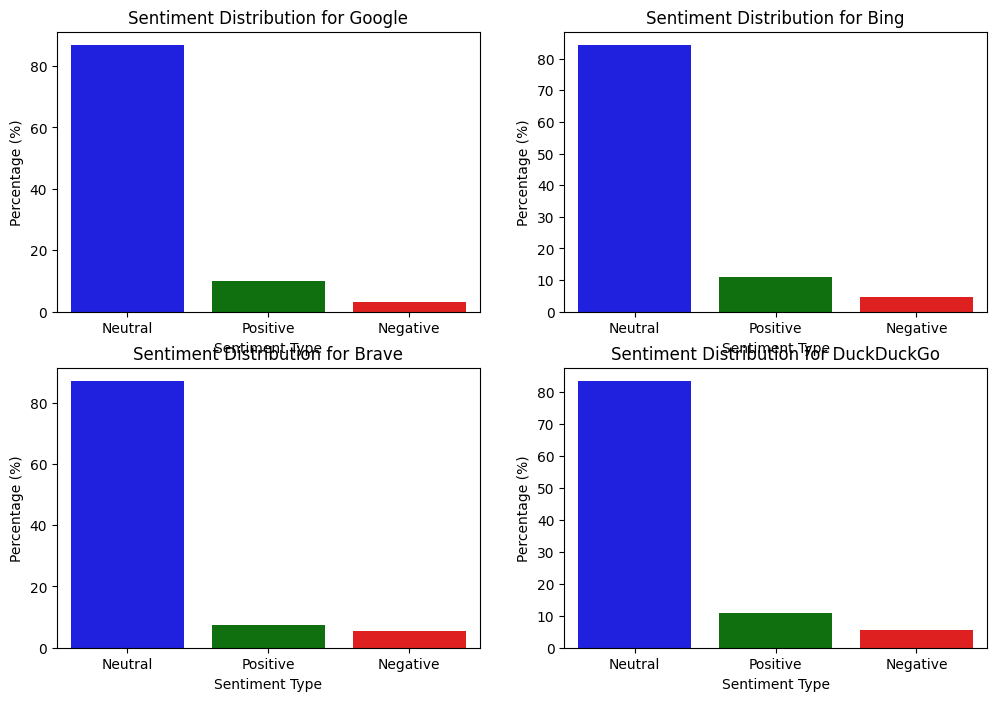

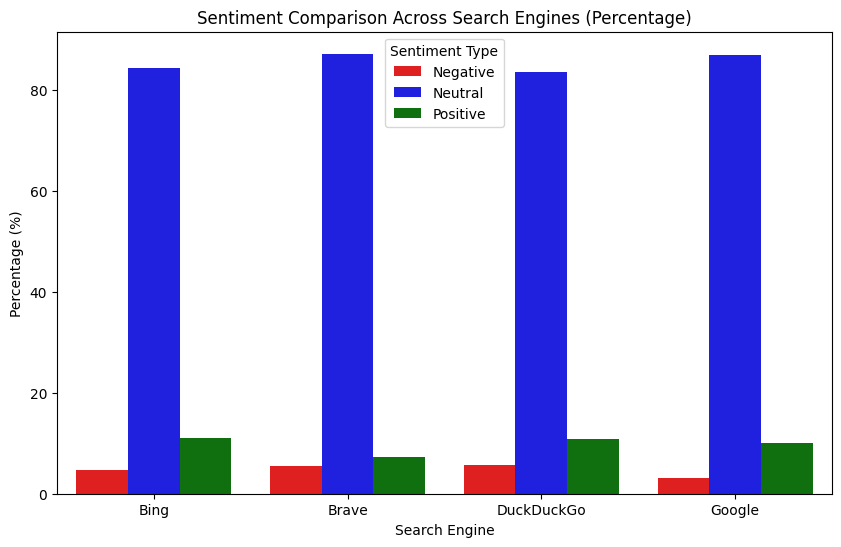

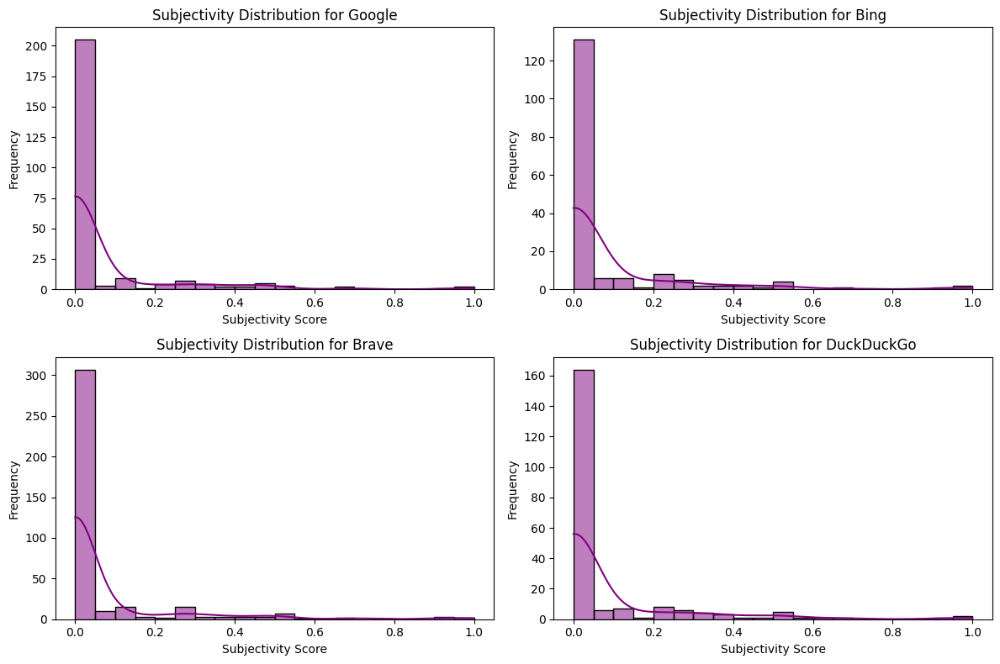

<ipython-input-9-bb589b508a7c>:94: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Search Engine", y="Subjectivity", data=sentiment_df, palette="coolwarm")


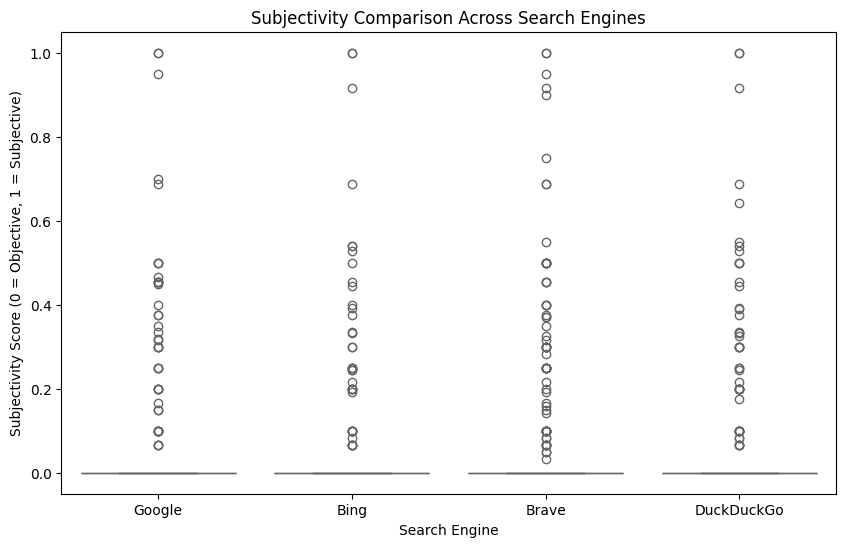

In [ ]:
analyze_sentiment(csv_filename)

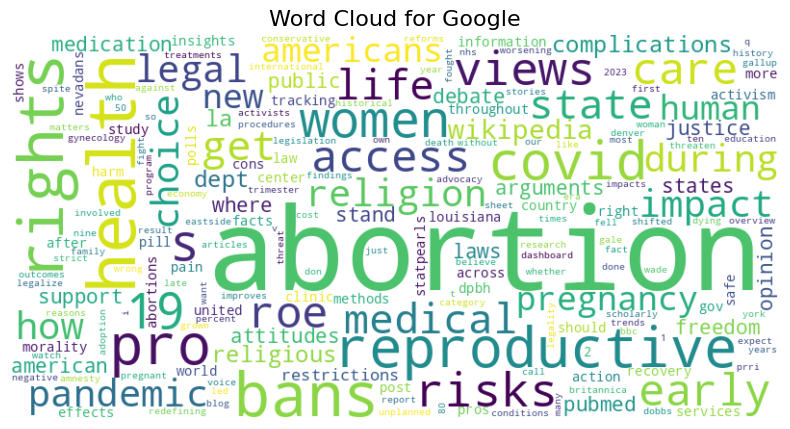

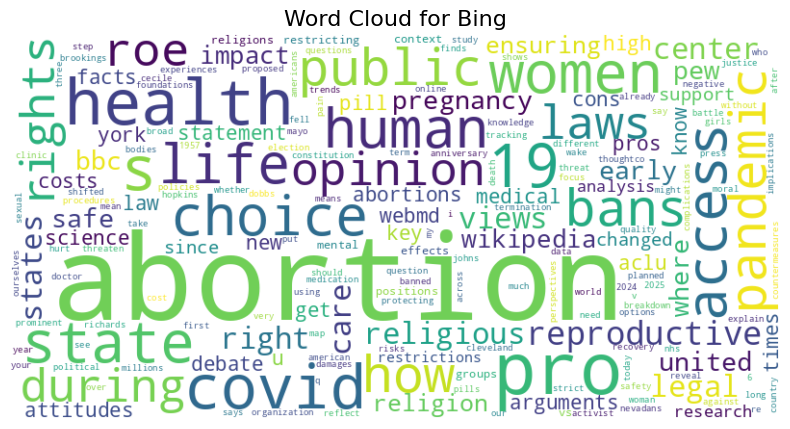

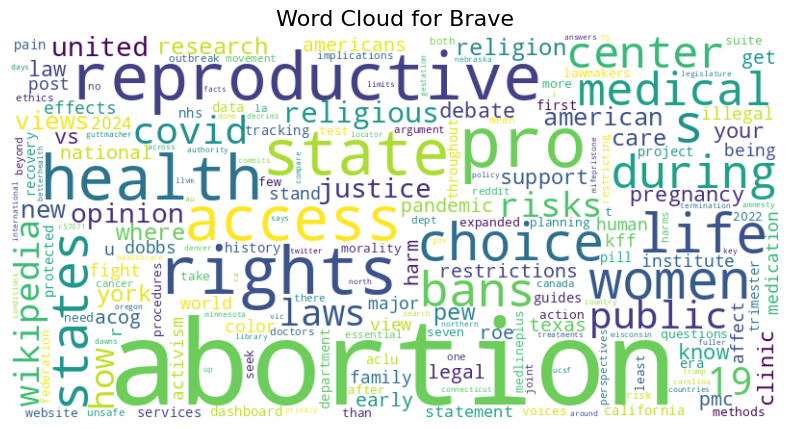

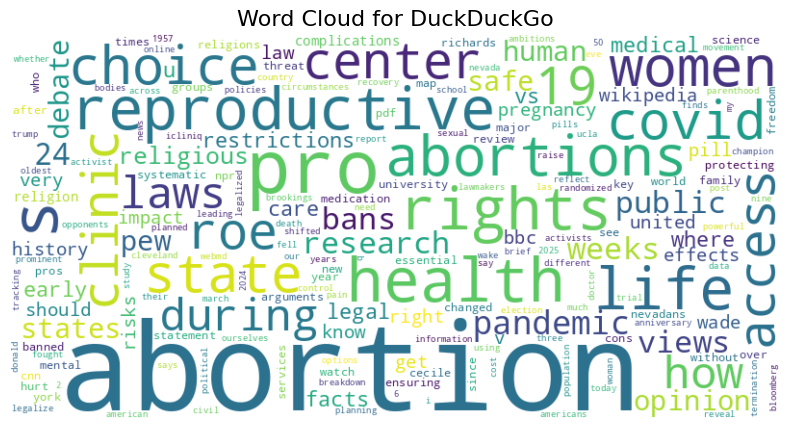

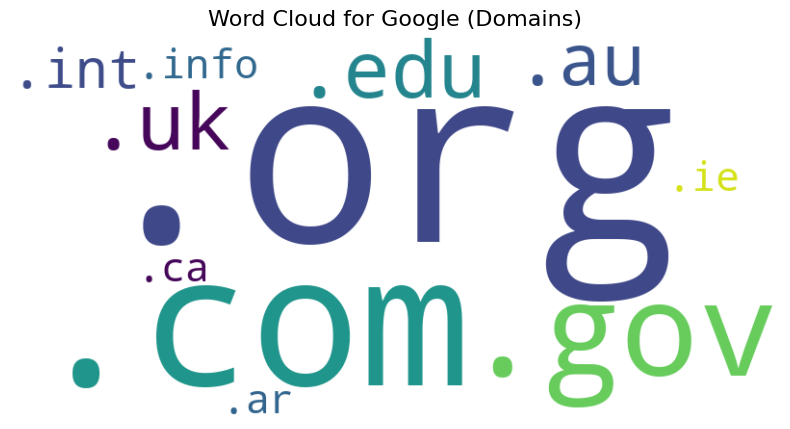

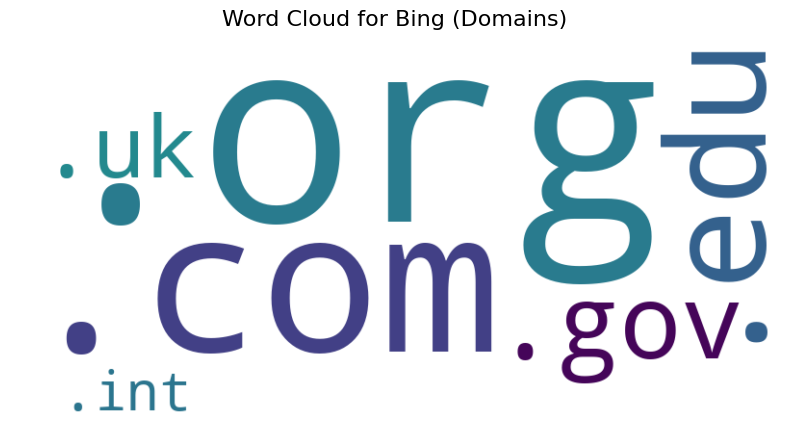

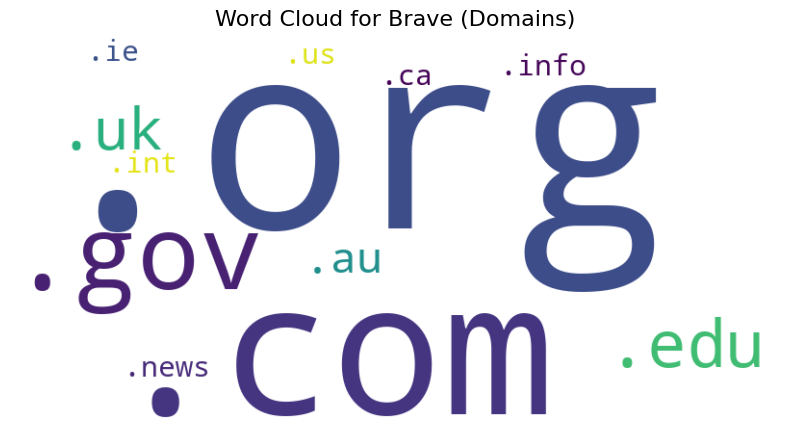

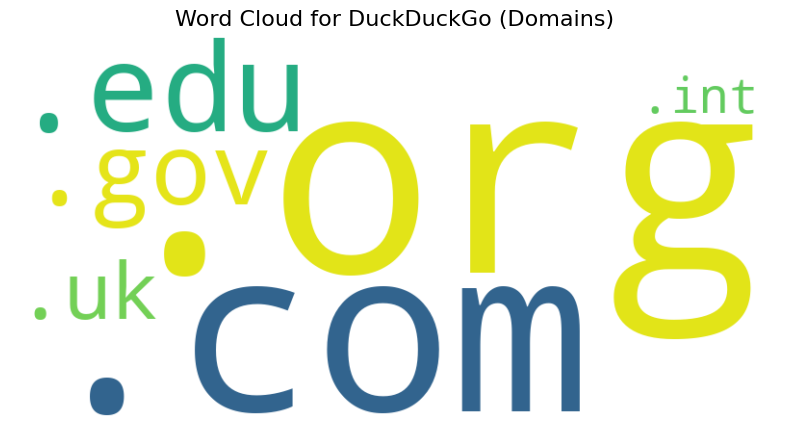

In [ ]:
generate_word_clouds(csv_filename)

<ipython-input-69-223bfdef62b3>:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(country_counts.keys()), y=list(country_counts.values()), palette='viridis')
<ipython-input-69-223bfdef62b3>:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(country_counts.keys()), y=list(country_counts.values()), palette='viridis')
<ipython-input-69-223bfdef62b3>:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(country_counts.keys()), y=list(country_counts.values()), palette='viridis')
<ipython-input-69-223bfdef62b3>:57: FutureWarning: 


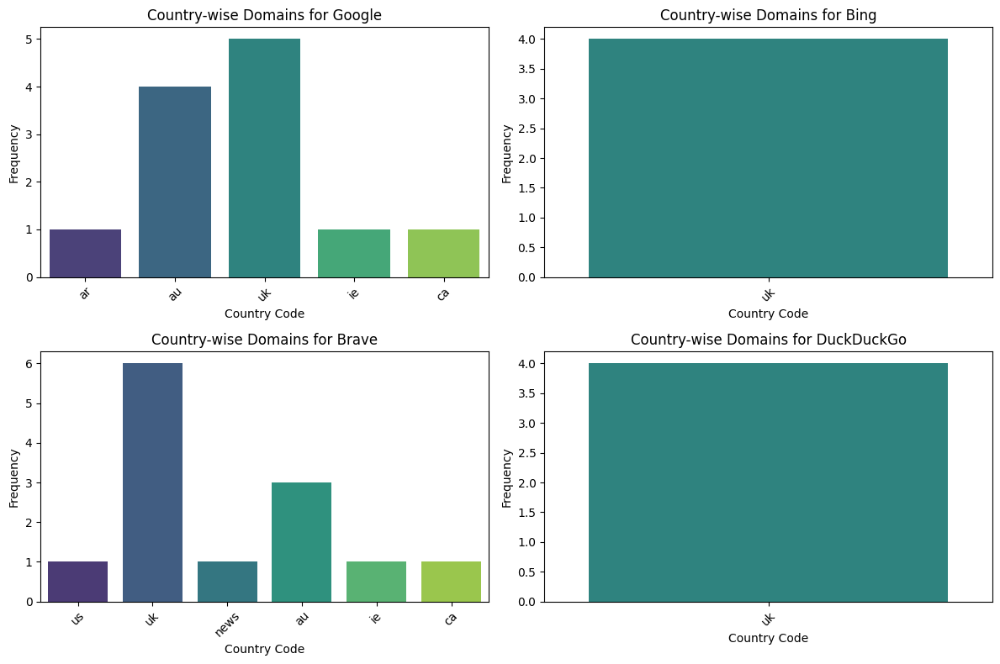

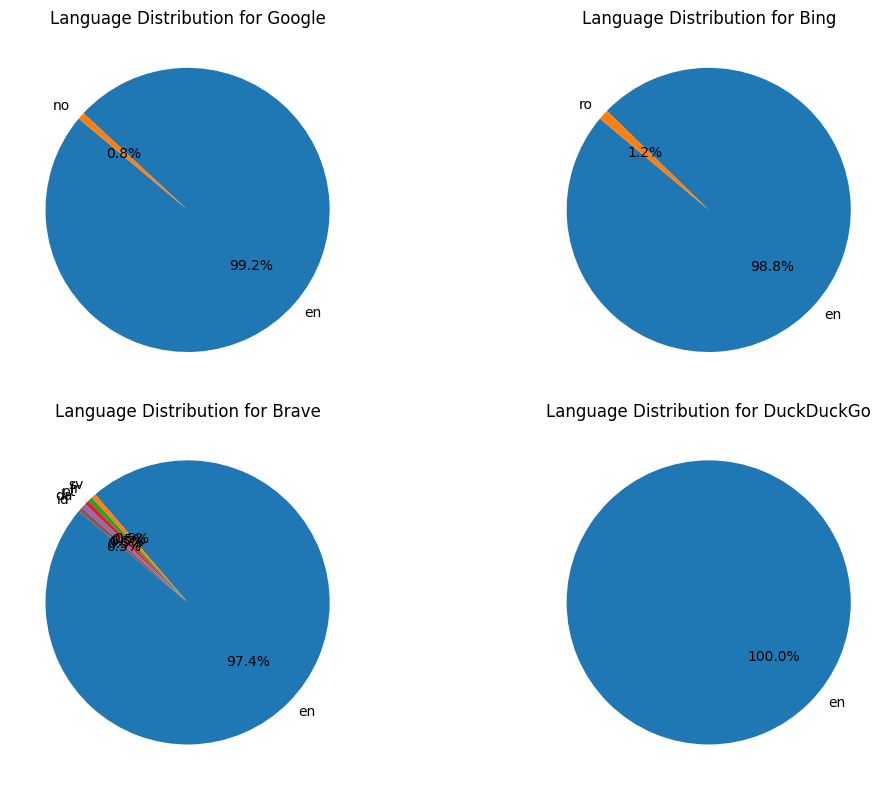

In [70]:
analyze_geographical_and_language_bias('search_results_3.csv')

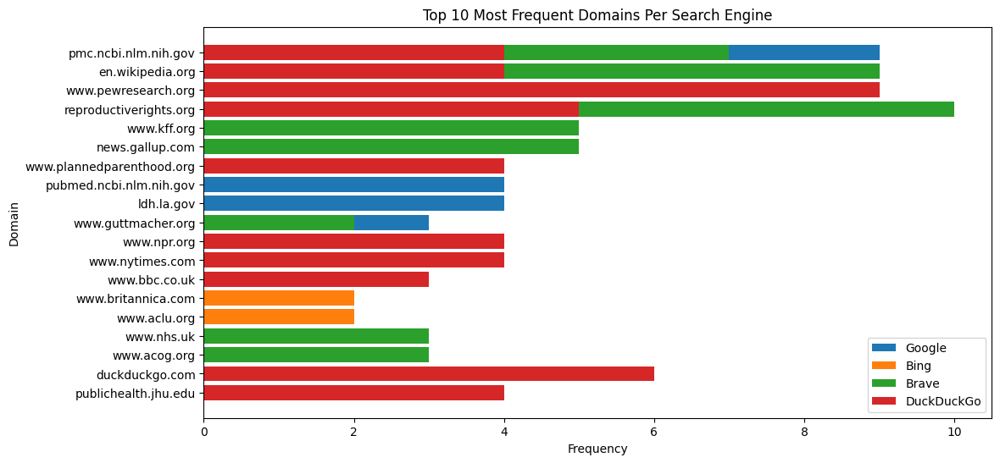

<ipython-input-10-de26791468fb>:45: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  domain_matrix = pd.DataFrame(index=all_domains, columns=domain_data.keys()).fillna(0)


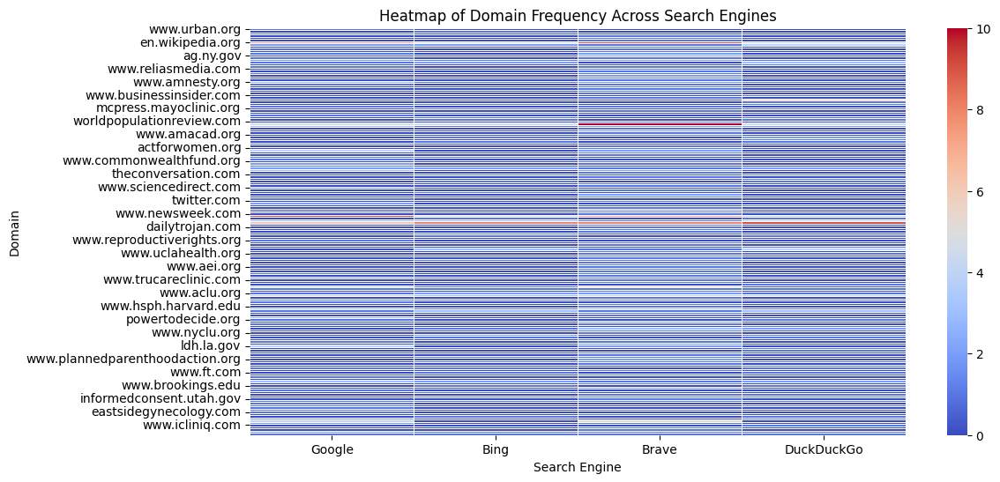

In [ ]:
analyze_domain_diversity("search_results_3.csv")

/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:402: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['jsjs', 'за'] not in stop_words.
  warnings.warn(


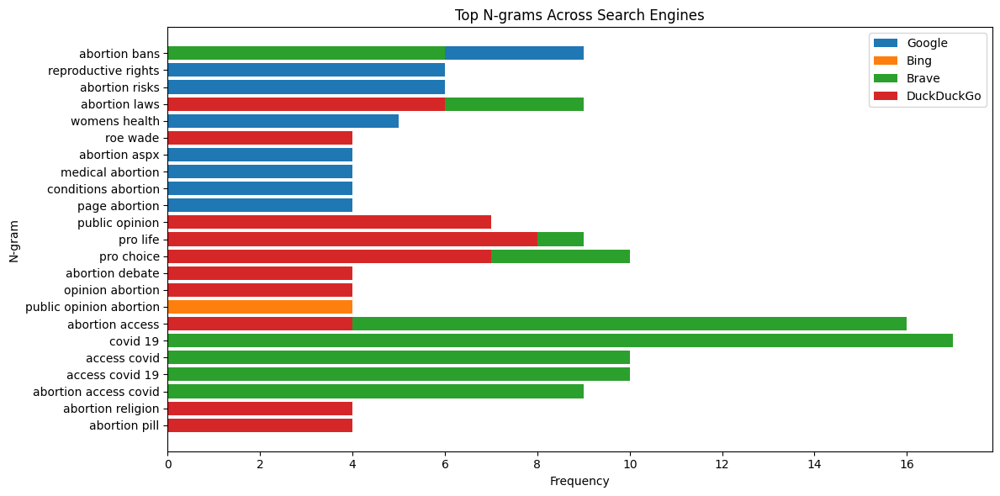

In [74]:
analyze_keywords('search_results_3.csv')

### Time of Search for Topic 1

#### Time: 8:00 am

#### Time: 4:00 pm

#### Time: 12:00 am

### Location


In [ ]:
search_engine_urls = {
    "Google": "https://www.google.com/search?q="
}

In [ ]:
save_search_results_to_csv(search_phrases, search_engine_urls, 'google_results_3.csv', locations)

Google search for 'Abortion laws' in us returned 12 results
Google search for 'Abortion laws' in uk returned 10 results
Google search for 'Abortion laws' in za returned 13 results
Google search for 'Should it be legal to abort' in us returned 13 results
Google search for 'Should it be legal to abort' in uk returned 14 results
Google search for 'Should it be legal to abort' in za returned 15 results
Google search for 'Early abortion' in us returned 13 results
Google search for 'Early abortion' in uk returned 13 results
Google search for 'Early abortion' in za returned 14 results
Google search for 'Reproductive rights activism' in us returned 14 results
Google search for 'Reproductive rights activism' in uk returned 12 results
Google search for 'Reproductive rights activism' in za returned 12 results
Google search for 'Public opinion and abortion laws' in us returned 14 results
Google search for 'Public opinion and abortion laws' in uk returned 14 results
Google search for 'Public opinio

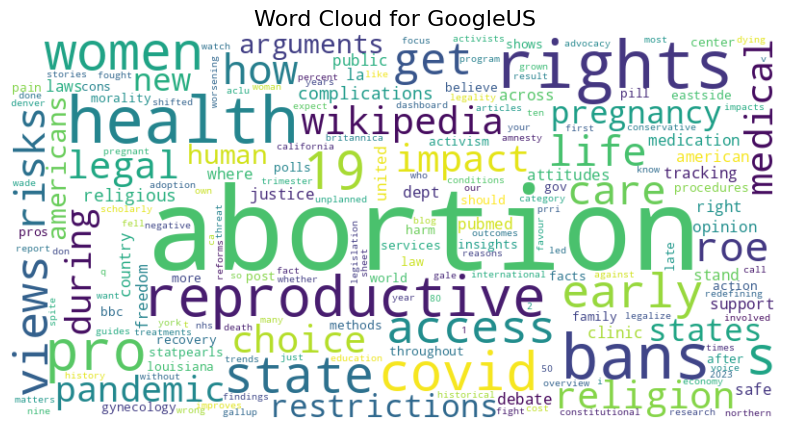

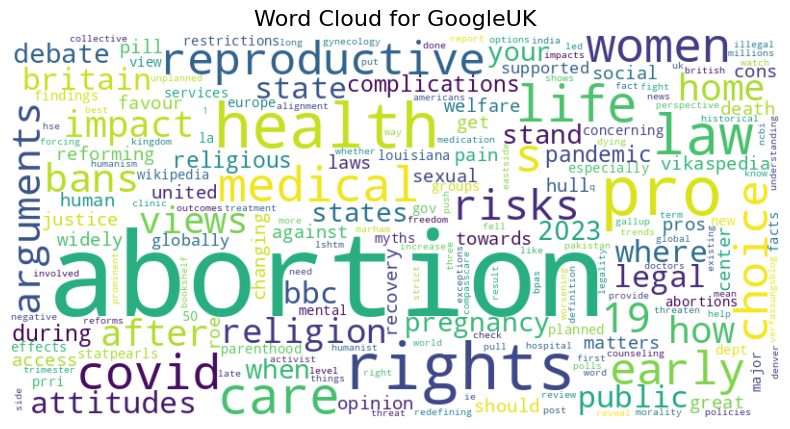

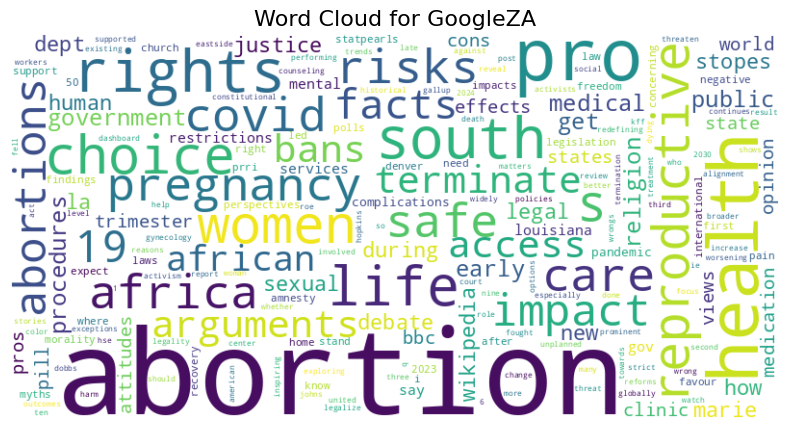

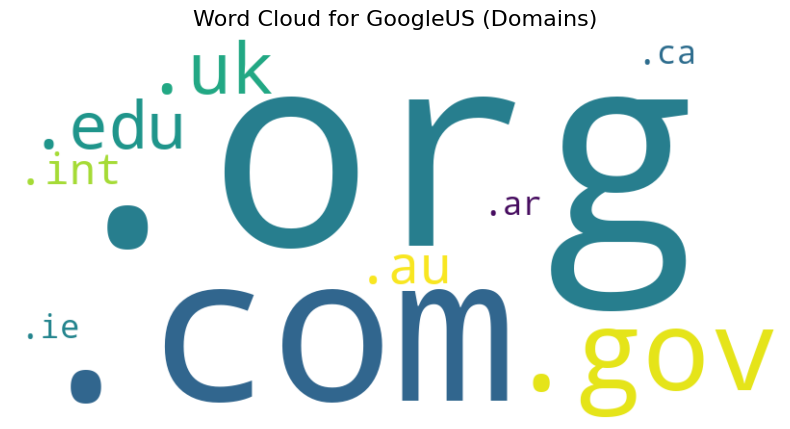

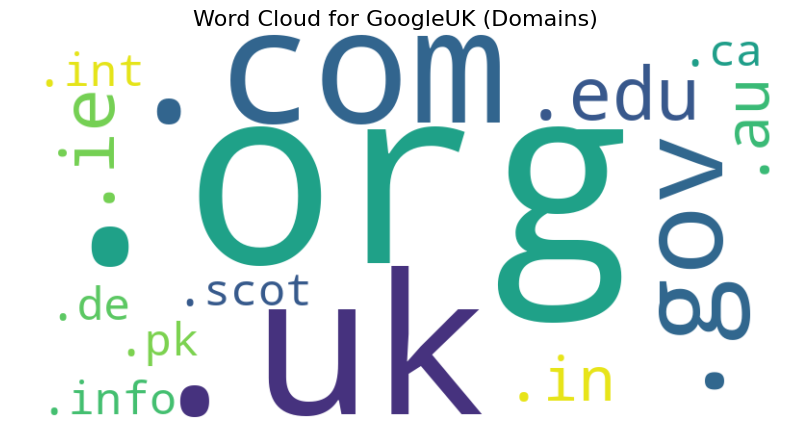

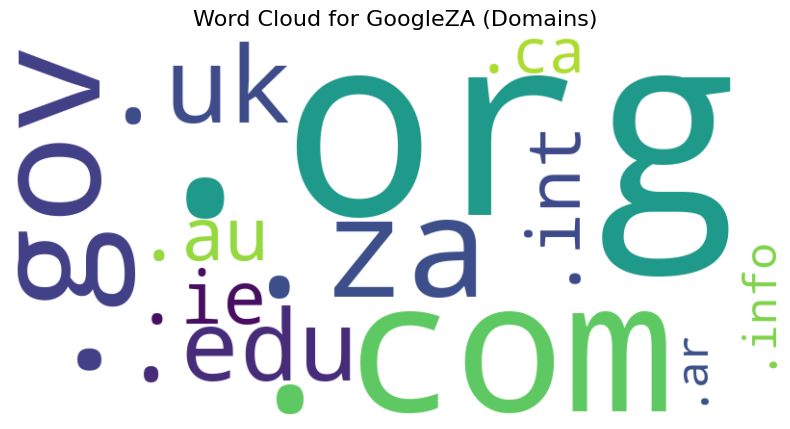

In [ ]:
generate_word_clouds('google_results_3.csv')

Sentiment analysis results saved to sentiment_analysis_results.csv


<ipython-input-9-bb589b508a7c>:55: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=sentiment_counts.index, y=sentiment_counts.values,
<ipython-input-9-bb589b508a7c>:55: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=sentiment_counts.index, y=sentiment_counts.values,
<ipython-input-9-bb589b508a7c>:55: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=sentiment_counts.index, y=sentiment_counts.values,


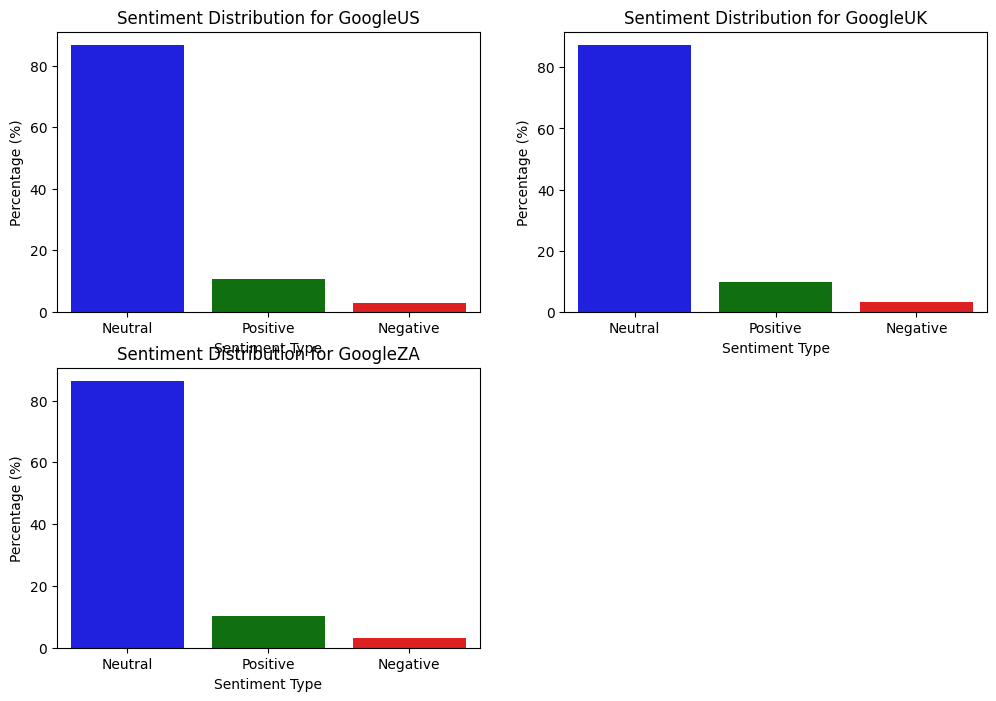

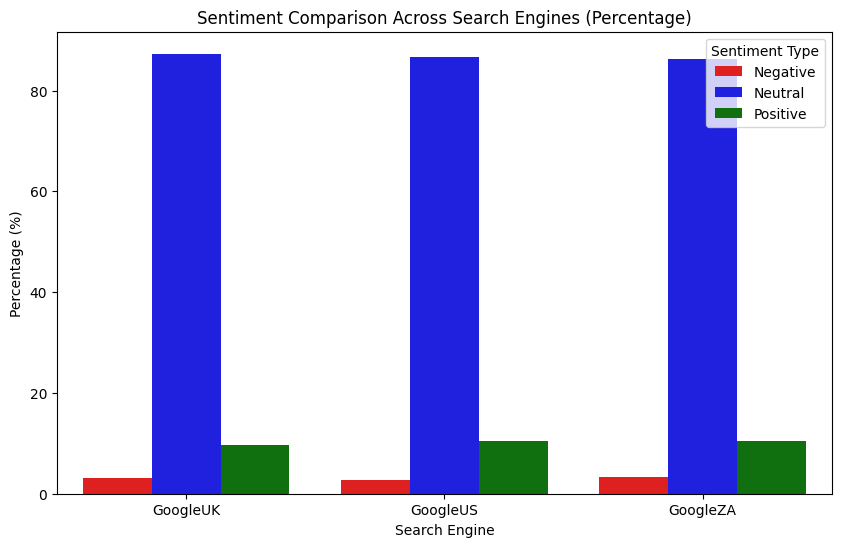

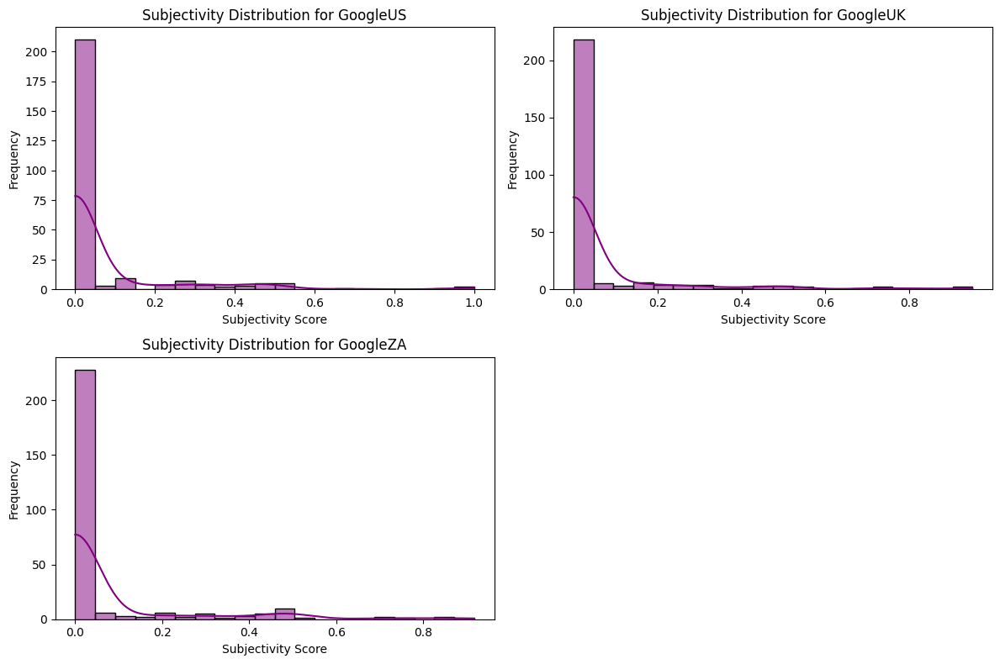

<ipython-input-9-bb589b508a7c>:94: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Search Engine", y="Subjectivity", data=sentiment_df, palette="coolwarm")


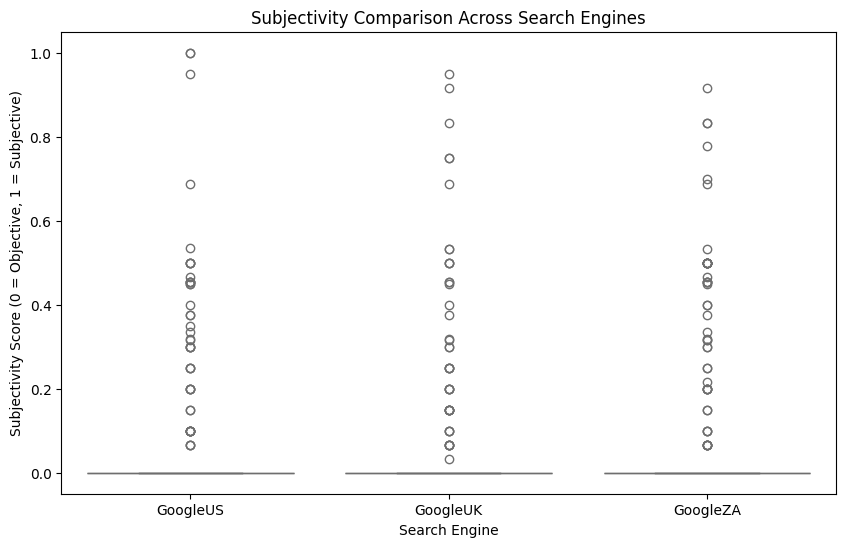

In [ ]:
analyze_sentiment('google_results_3.csv')

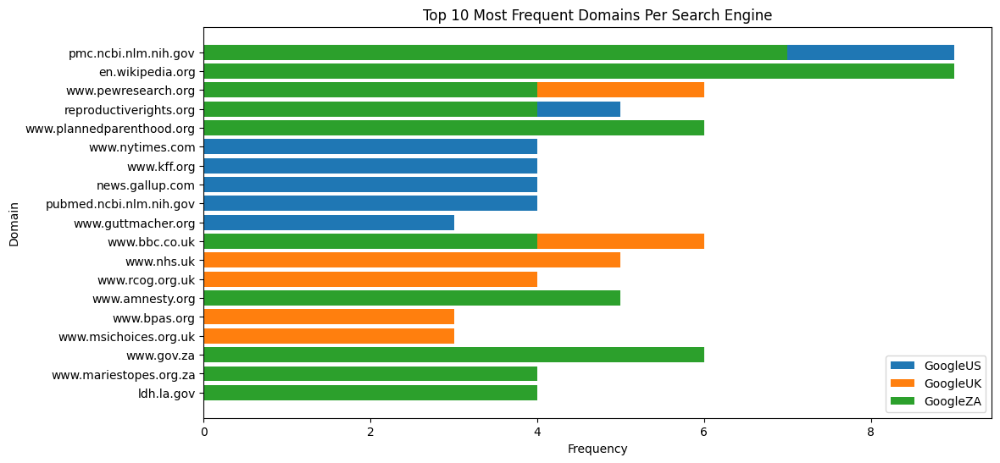

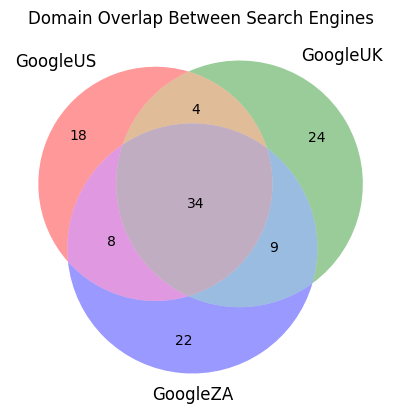

<ipython-input-10-de26791468fb>:45: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  domain_matrix = pd.DataFrame(index=all_domains, columns=domain_data.keys()).fillna(0)


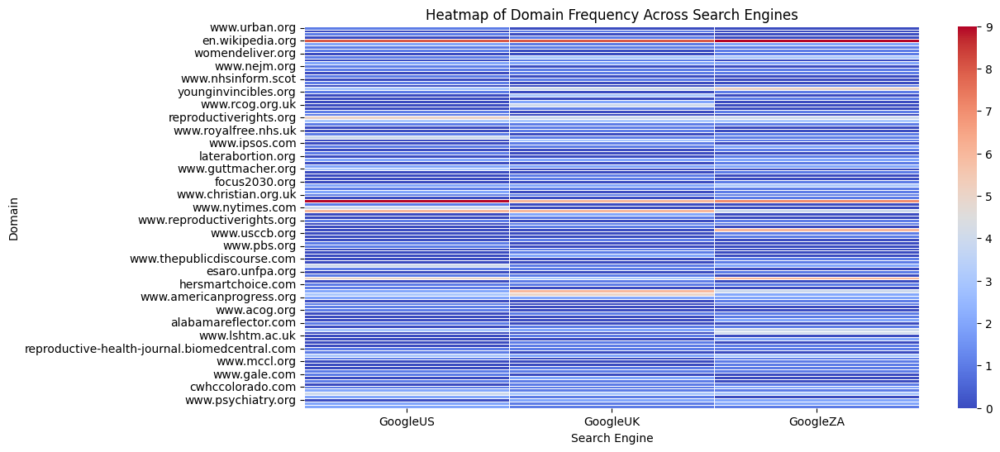

In [ ]:
analyze_domain_diversity('google_results_3.csv')

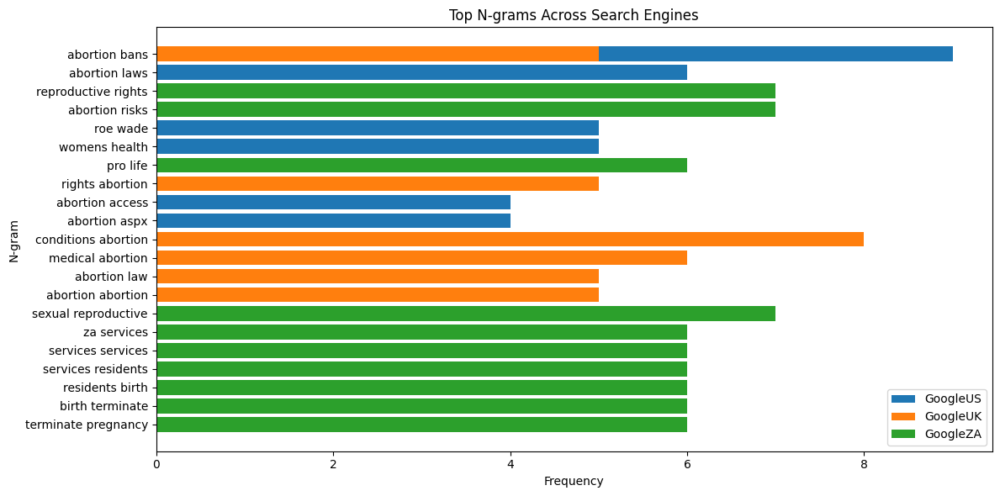

In [ ]:
analyze_keywords('google_results_3.csv')